In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown
from scipy.stats import pearsonr, spearmanr, ks_2samp, mannwhitneyu, ttest_ind

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
THRESHOLD = utils.ILST_THRESHOLD
THRESHOLD

0.06

In [3]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov4_allmodels_cal.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 122 entries, PatientID to Solid
dtypes: bool(25), float64(83), int64(11), object(3)
memory usage: 12.3+ MB


In [4]:
with open(f'{NLST_PREDS}/nlst_demo_v4_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [5]:
nlst_preds = utils.prep_nlst_preds(nlst_preds_nodule, scanlevel=True, tijmen=False, sybil=True)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5911 entries, 0 to 10150
Columns: 117 entries, PatientID to Solid
dtypes: bool(25), float64(80), int64(11), object(1)
memory usage: 4.3+ MB


In [6]:
MODEL_TO_COL = {
    "Venkadesh": "DL_cal",
    # "de Haas Combined": "Thijmen_mean",
    "de Haas Local": "Thijmen_local_cal",
    # "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    "de Haas Global (w/nodule)": "Thijmen_global_show_cal",
    "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

## Plot results by category

In [7]:
def modelstats_by_cat(df, cat, threshold, models=MODEL_TO_COL):
    groups = df.groupby(cat)
    df_catinfo, skips = utils.info_by_splits(groups, min_mal=0)
    perfs = {}

    for m in models:
        stats, vals = [], []
        vals.append('ALL')
        stats.append(
            utils.stats_from_cm(
                *utils.cm_with_thres(
                    df,
                    threshold=threshold,
                    pred_col=models[m],
                    true_col='label',
                )
            )
        )

        for val, df_group in groups:
            if val not in skips:
                vals.append(val)
                stats.append(
                    utils.stats_from_cm(
                        *utils.cm_with_thres(
                            df_group,
                            threshold=threshold,
                            pred_col=models[m],
                            true_col='label',
                        )
                    )
                )

        perfs[m] = pd.DataFrame(stats, index=vals)
        perfs[m]['model'] = [m] * len(perfs[m])
    
    return df_catinfo, perfs

In [30]:
def plot_by_category(df, c, threshold=THRESHOLD):
    display(Markdown(f"### {c}"))
    df_catinfo, perfs = modelstats_by_cat(df, c, threshold)
    display(df_catinfo)

    metrics_to_plot = ['fpr', 'fnr']
    fig, ax = plt.subplots(len(metrics_to_plot), 1, figsize=(5 * (len(df_catinfo)), len(metrics_to_plot) * 7))
    first_df = list(perfs.values())[0]

    # for m in perfs: 
    #     print(m)
    #     display(perfs[m])

    for i, metric in enumerate(metrics_to_plot):
        category = list(first_df.index.values)
        print(category)
        perf_metrics = {m: list(perfs[m][metric]) for m in perfs}
        x = np.arange(len(category))  # the label locations
        width = 0.15  # the width of the bars
        multiplier = 0

        for attribute, measurement in perf_metrics.items():
            offset = (width) * ((multiplier))
            rects = ax[i].bar(x + offset, measurement, width, label=attribute)
            ax[i].bar_label(rects, padding=3, fmt='%.2f', fontsize='x-small')
            multiplier += 1

        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax[i].set_ylabel(metric)
        ax[i].set_title(f'{metric} by {c} (threshold={threshold:.2f})')
        ax[i].set_xticks(x + width, [f"{val}\n({first_df.loc[val, 'mal']} mal, {first_df.loc[val, 'ben']} ben)" for val in category])
        # ax[i].set_xticks(x + width, category)
        ax[i].legend(loc='upper left')
        ax[i].set_ylim(0, 1)

    plt.show()

### Included columns (from predictions)

### wrknomask

,num,pct,num_mal,pct_mal
False,4407,74.555913,442,10.029499
True,1504,25.444087,139,9.242021


['ALL', False, True]
['ALL', False, True]


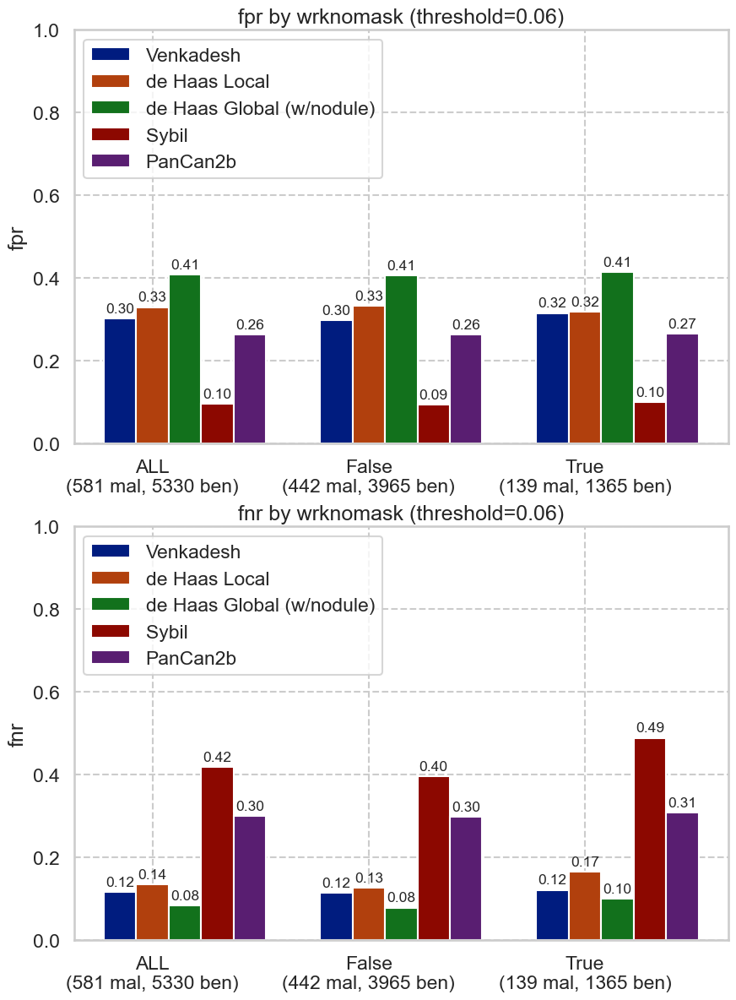

### FamilyHistoryLungCa

,num,pct,num_mal,pct_mal
False,4384,74.166808,401,9.146898
True,1527,25.833192,180,11.787819


['ALL', False, True]
['ALL', False, True]


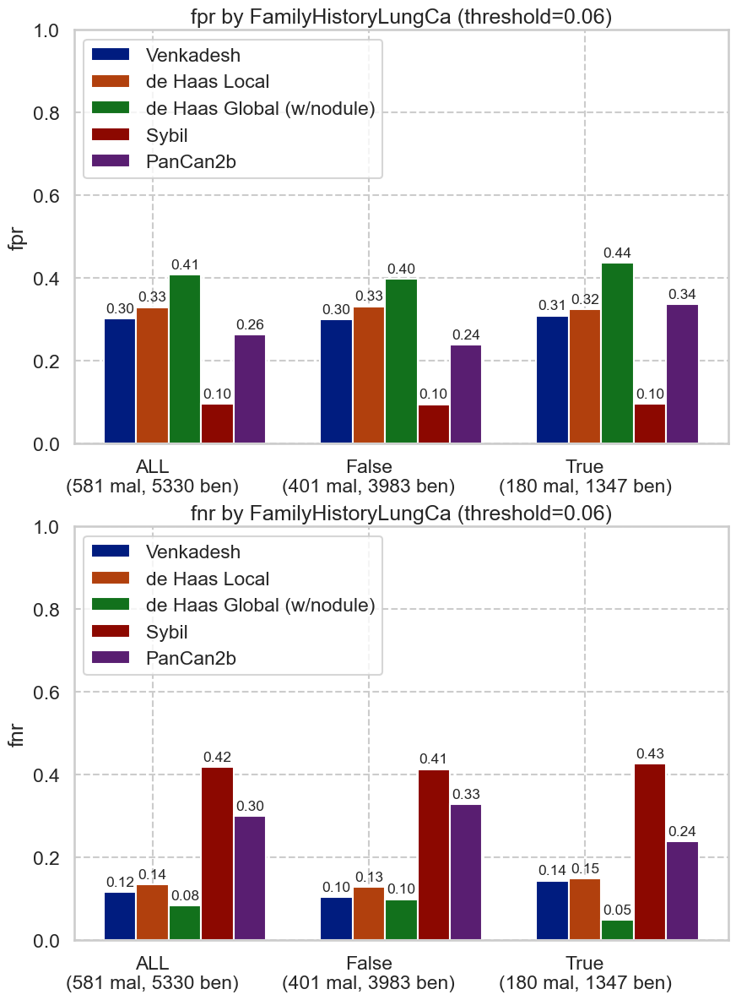

### PersonalCancerHist

,num,pct,num_mal,pct_mal
False,4183,70.766368,377,9.012670
True,1728,29.233632,204,11.805556


['ALL', False, True]
['ALL', False, True]


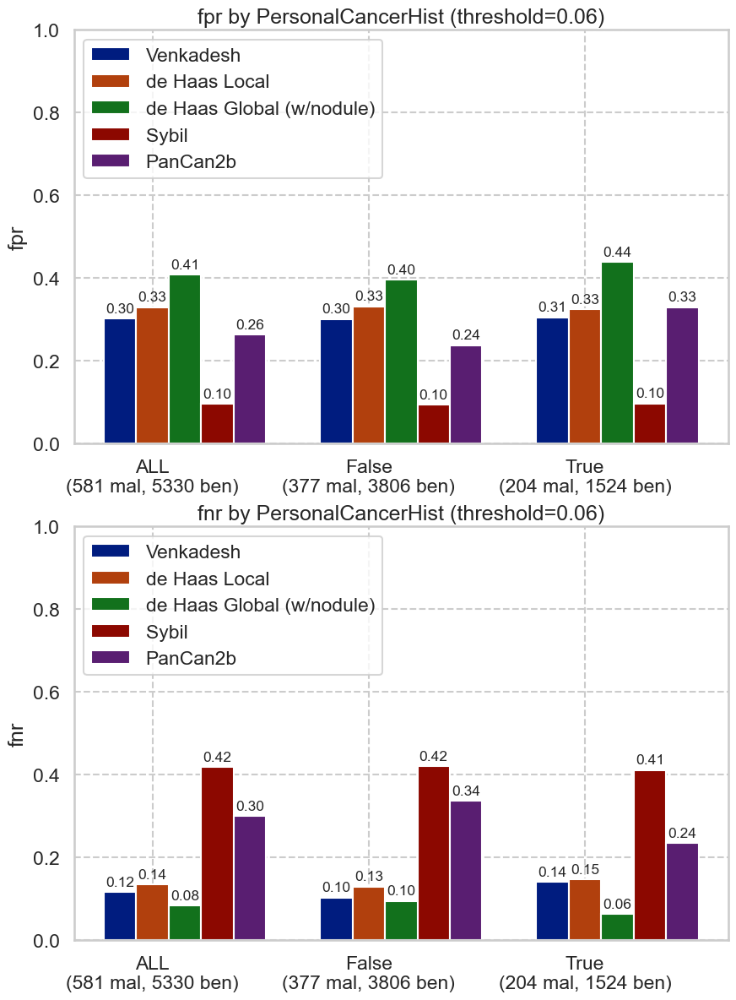

### Emphysema

,num,pct,num_mal,pct_mal
False,3755,63.52563,317,8.442077
True,2156,36.47437,264,12.244898


['ALL', False, True]
['ALL', False, True]


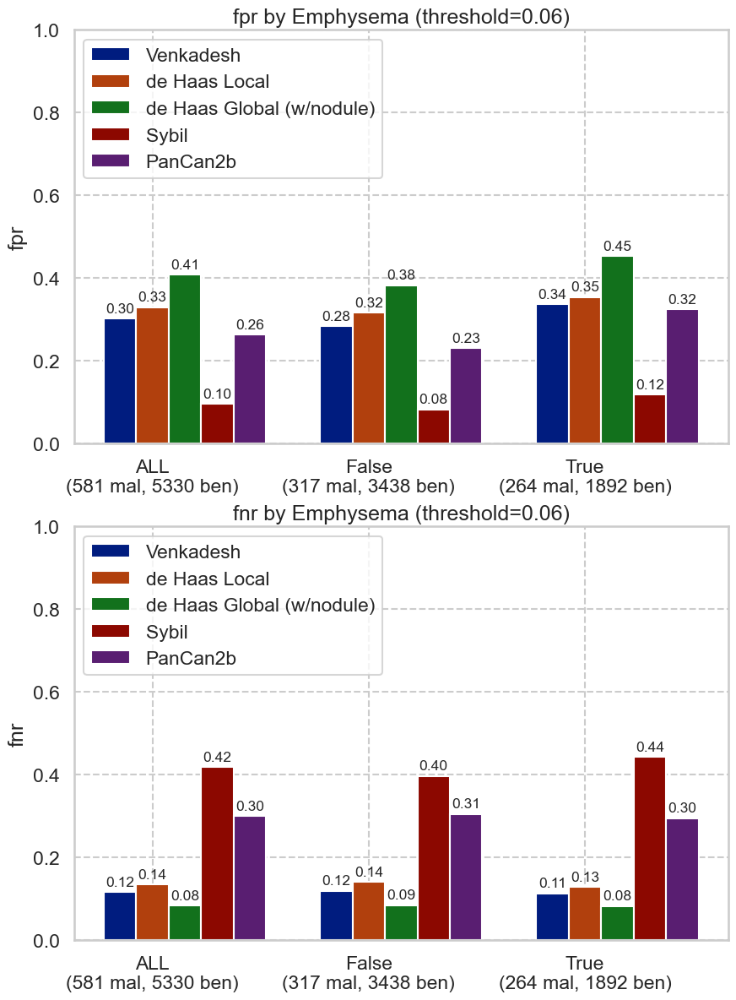

In [31]:
for c in nlst_democols['cat']['other']:
    plot_by_category(nlst_preds, c)

### Demographics

### marital

,num,pct,num_mal,pct_mal
1.0,229,3.882672,16,6.986900
2.0,3974,67.378772,384,9.662808
3.0,507,8.596134,49,9.664694
4.0,65,1.102068,5,7.692308
5.0,1123,19.040353,125,11.130899


['ALL', 1.0, 2.0, 3.0, 4.0, 5.0]
['ALL', 1.0, 2.0, 3.0, 4.0, 5.0]


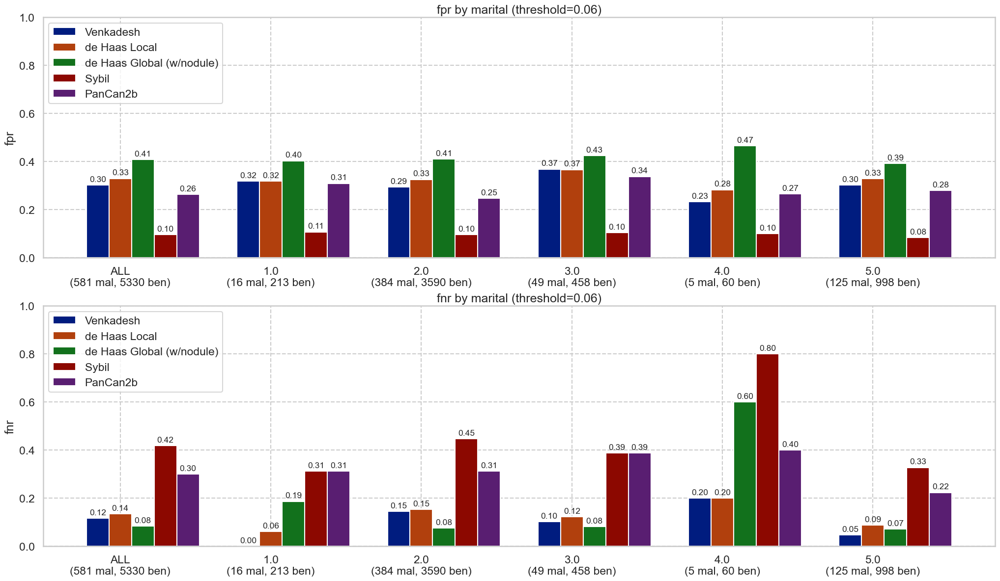

### educat

,num,pct,num_mal,pct_mal
1.0,111,1.913793,9,8.108108
2.0,290,5.000000,32,11.034483
3.0,1479,25.500000,141,9.533469
4.0,852,14.689655,87,10.211268
5.0,1301,22.431034,126,9.684858
6.0,913,15.741379,96,10.514786
7.0,854,14.724138,76,8.899297


['ALL', 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0]
['ALL', 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0]


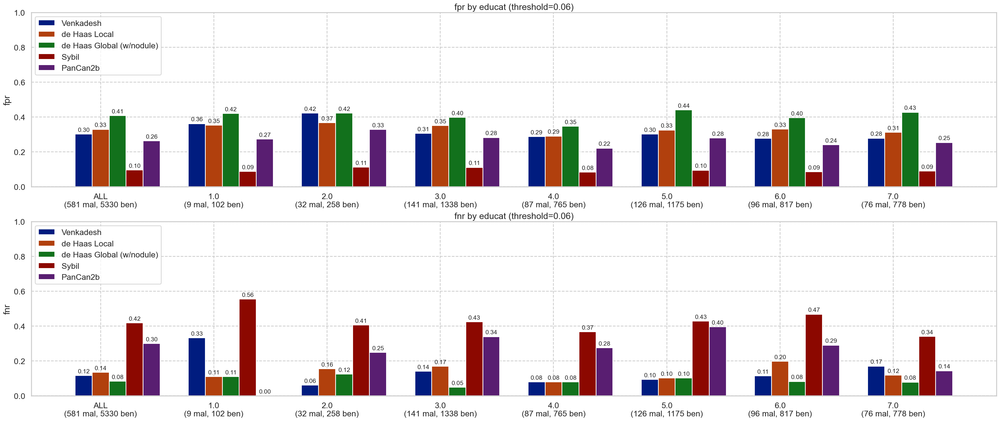

### race

,num,pct,num_mal,pct_mal
1.0,5523,93.785023,530,9.596234
2.0,188,3.192393,28,14.893617
3.0,72,1.222618,6,8.333333
4.0,23,0.390559,8,34.782609
5.0,18,0.305655,1,5.555556
6.0,65,1.103753,6,9.230769


['ALL', 1.0, 2.0, 3.0, 4.0, 5.0, 6.0]
['ALL', 1.0, 2.0, 3.0, 4.0, 5.0, 6.0]


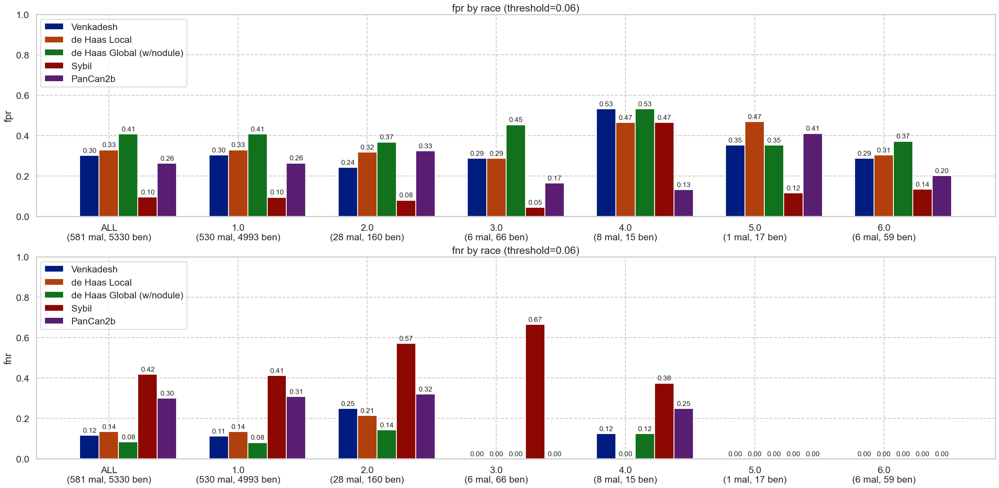

### ethnic

,num,pct,num_mal,pct_mal
1.0,98,1.667517,4,4.081633
2.0,5779,98.332483,574,9.932514


['ALL', 1.0, 2.0]
['ALL', 1.0, 2.0]


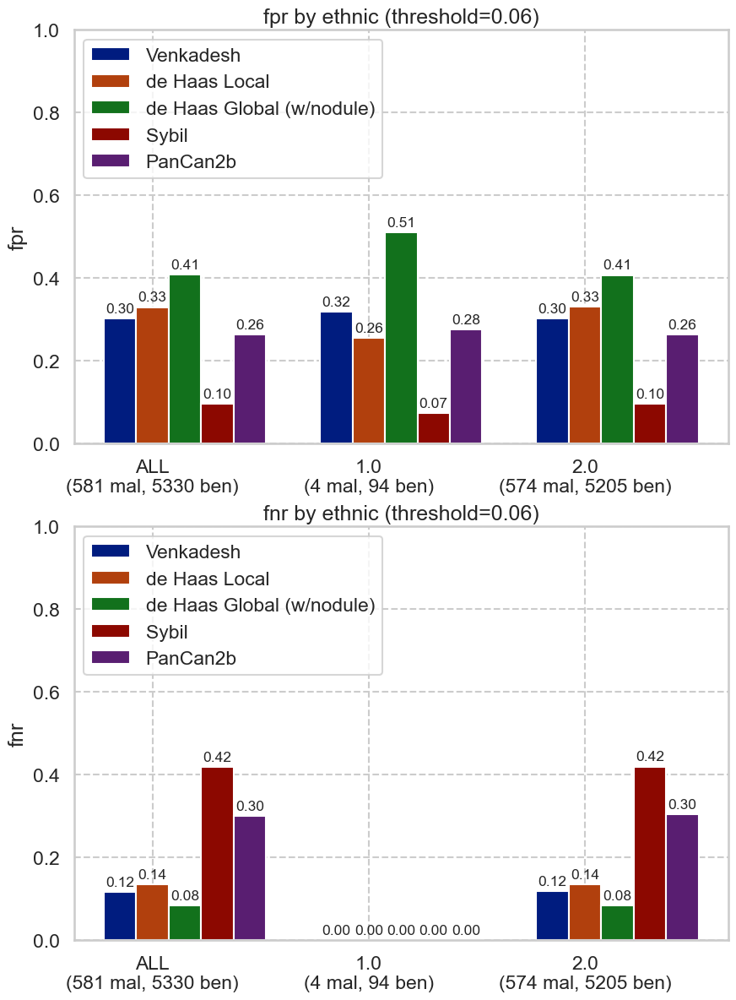

### Gender

,num,pct,num_mal,pct_mal
1,3441,58.2135,337,9.793665
2,2470,41.7865,244,9.878543


['ALL', 1, 2]
['ALL', 1, 2]


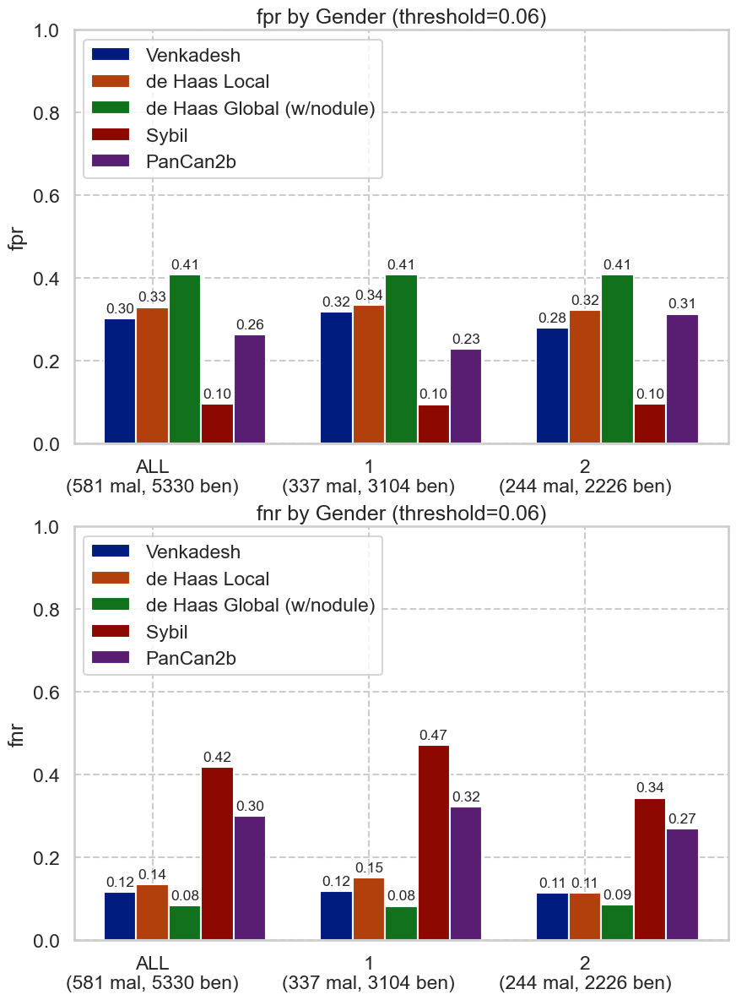

### Married

,num,pct,num_mal,pct_mal
False,1937,32.769413,197,10.170367
True,3974,67.230587,384,9.662808


['ALL', False, True]
['ALL', False, True]


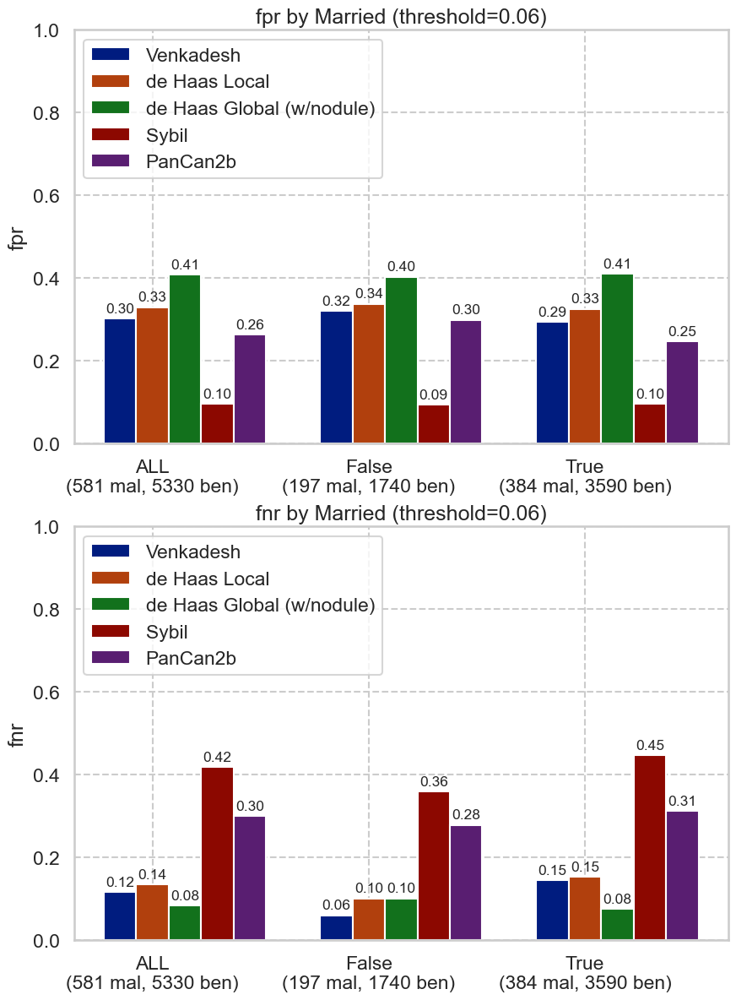

### NonHispanicWhite

,num,pct,num_mal,pct_mal
False,481,8.137371,55,11.434511
True,5430,91.862629,526,9.686924


['ALL', False, True]
['ALL', False, True]


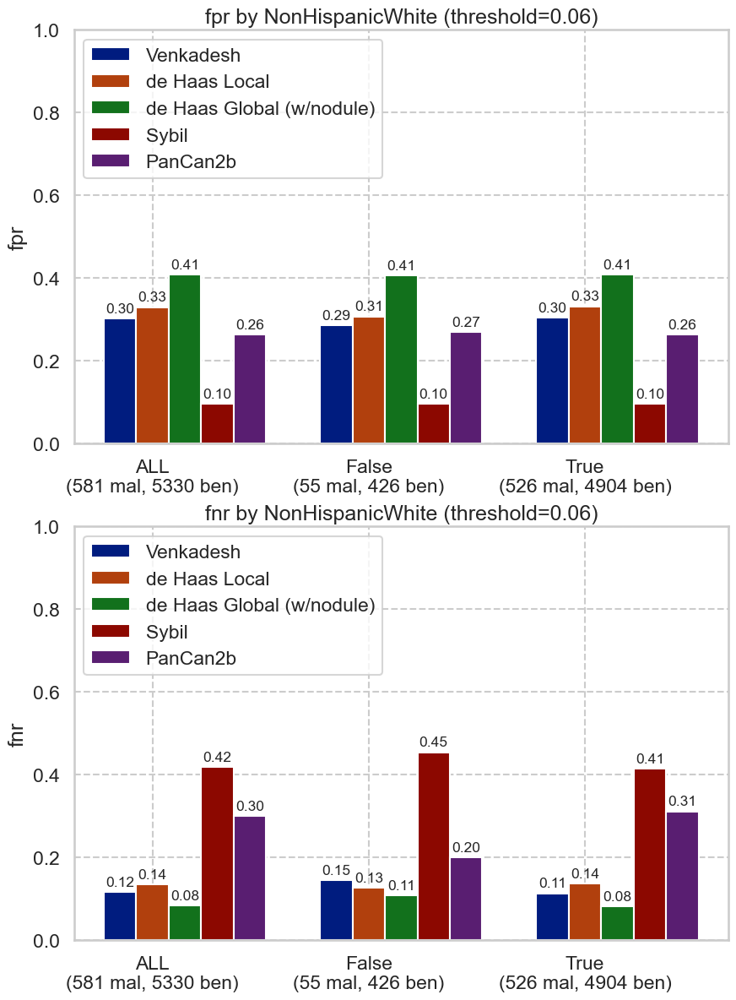

### HighSchoolPlus

,num,pct,num_mal,pct_mal
False,111,1.877855,9,8.108108
True,5800,98.122145,572,9.862069


['ALL', False, True]
['ALL', False, True]


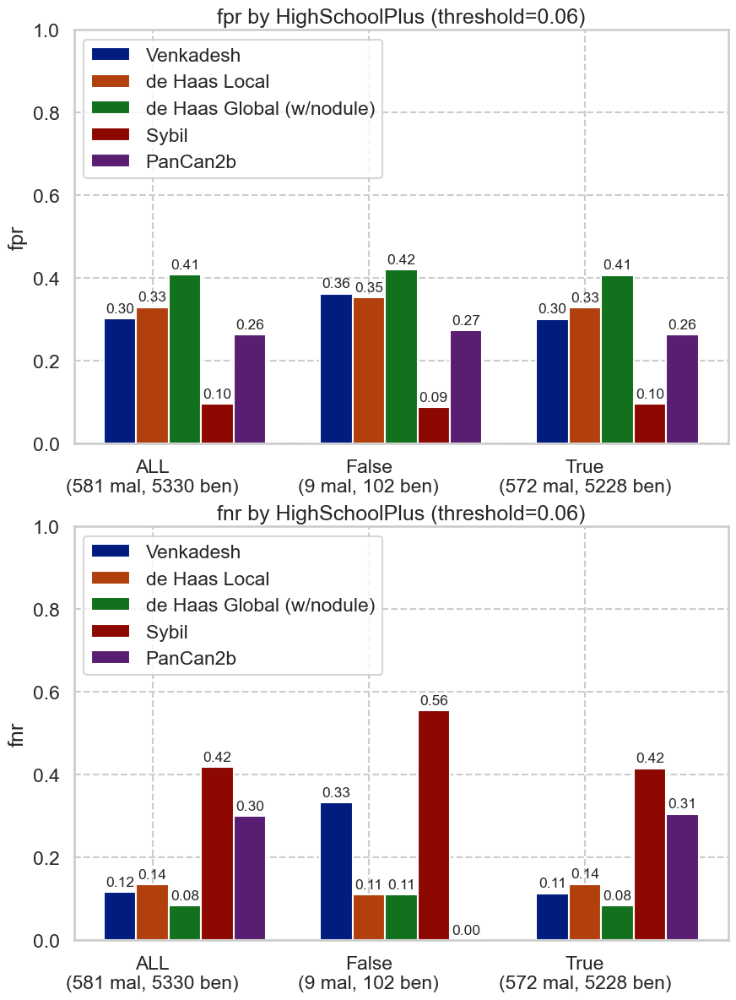

In [32]:
for cat in nlst_democols['cat']['demo']:
    plot_by_category(nlst_preds, cat)

### Smoking

### cigar

,num,pct,num_mal,pct_mal
0.0,4738,80.496092,470,9.919797
1.0,1148,19.503908,109,9.494774


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


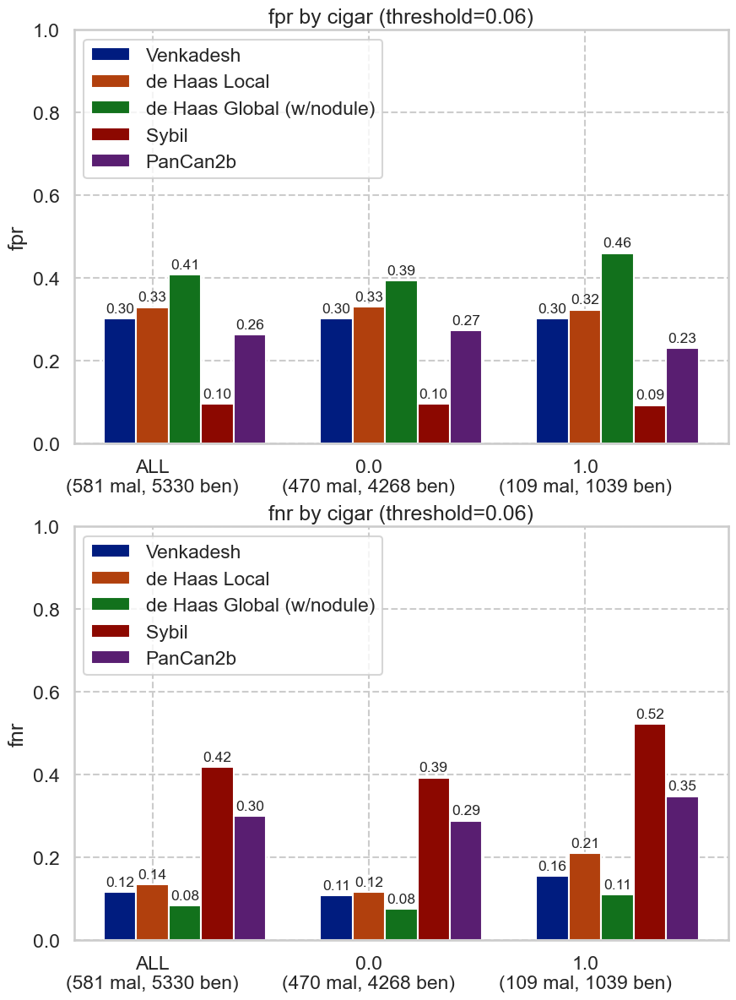

### cigsmok

,num,pct,num_mal,pct_mal
0,2930,49.568601,267,9.112628
1,2981,50.431399,314,10.533378


['ALL', 0, 1]
['ALL', 0, 1]


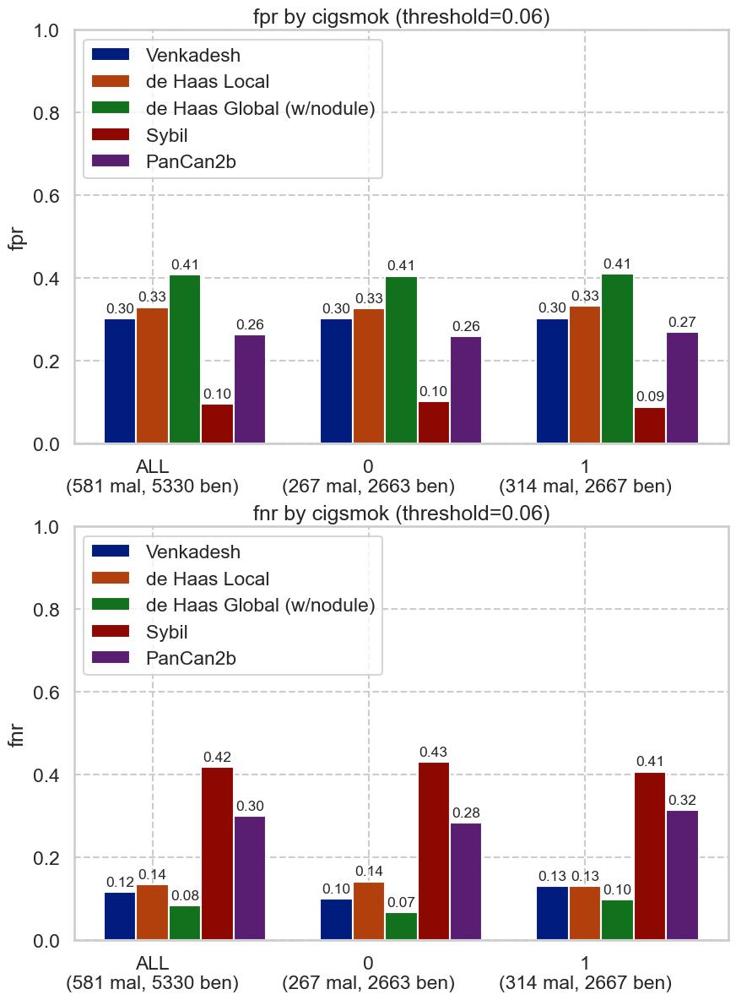

### pipe

,num,pct,num_mal,pct_mal
0.0,4575,77.859088,436,9.530055
1.0,1301,22.140912,143,10.991545


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


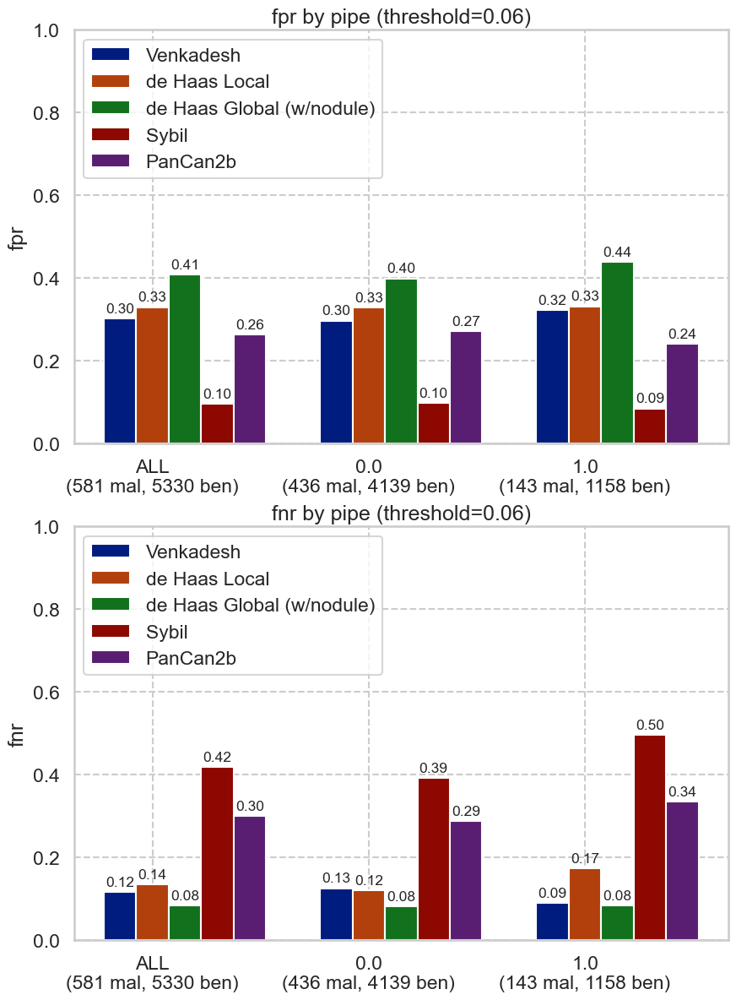

### smokelive

,num,pct,num_mal,pct_mal
0.0,665,11.317223,64,9.62406
1.0,5211,88.682777,514,9.86375


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


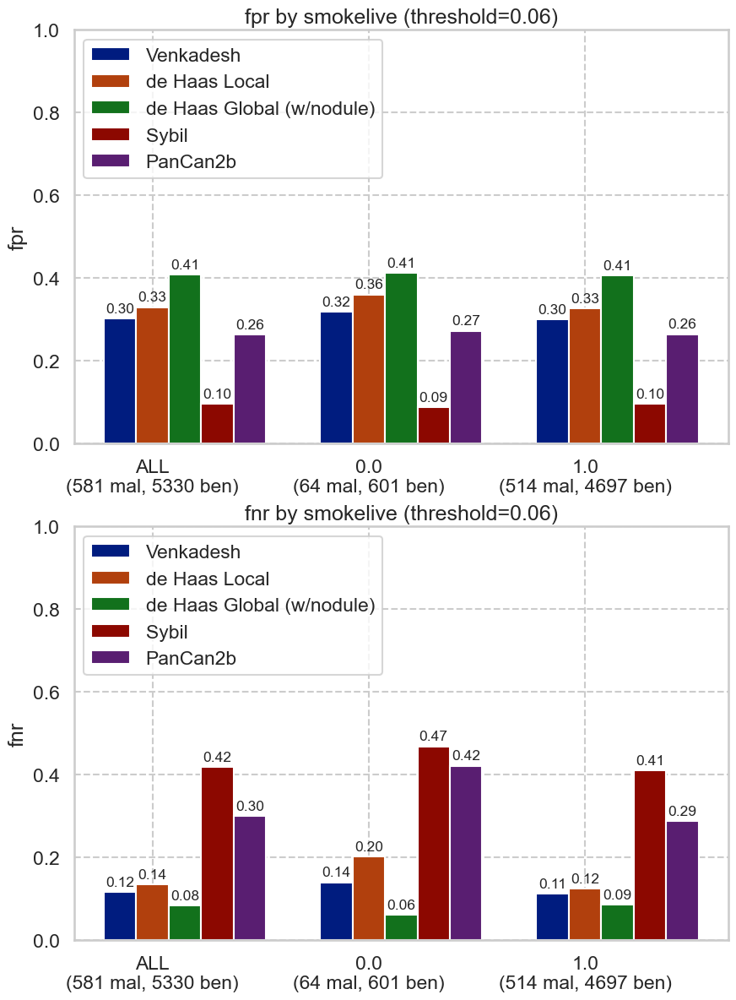

### smokework

,num,pct,num_mal,pct_mal
0.0,722,12.314515,65,9.002770
1.0,5141,87.685485,512,9.959152


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


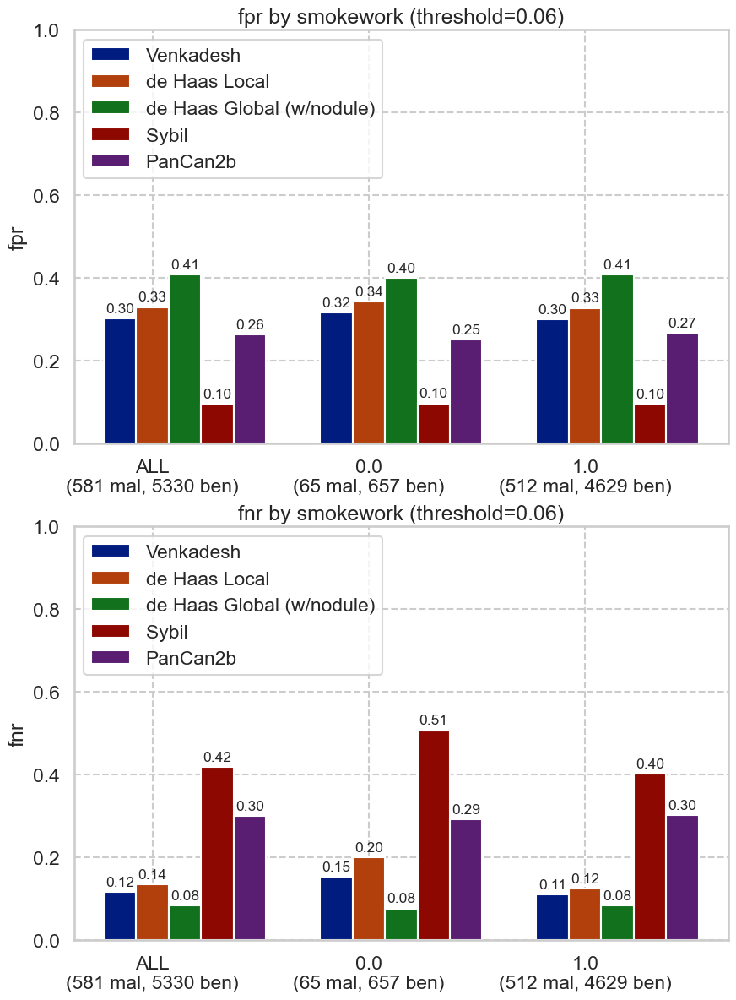

In [33]:
for cat in nlst_democols['cat']['smoke']:
    plot_by_category(nlst_preds, cat)

### Work history

### wrkasbe

,num,pct,num_mal,pct_mal
0.0,5610,94.923858,541,9.643494
1.0,300,5.076142,39,13.000000


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


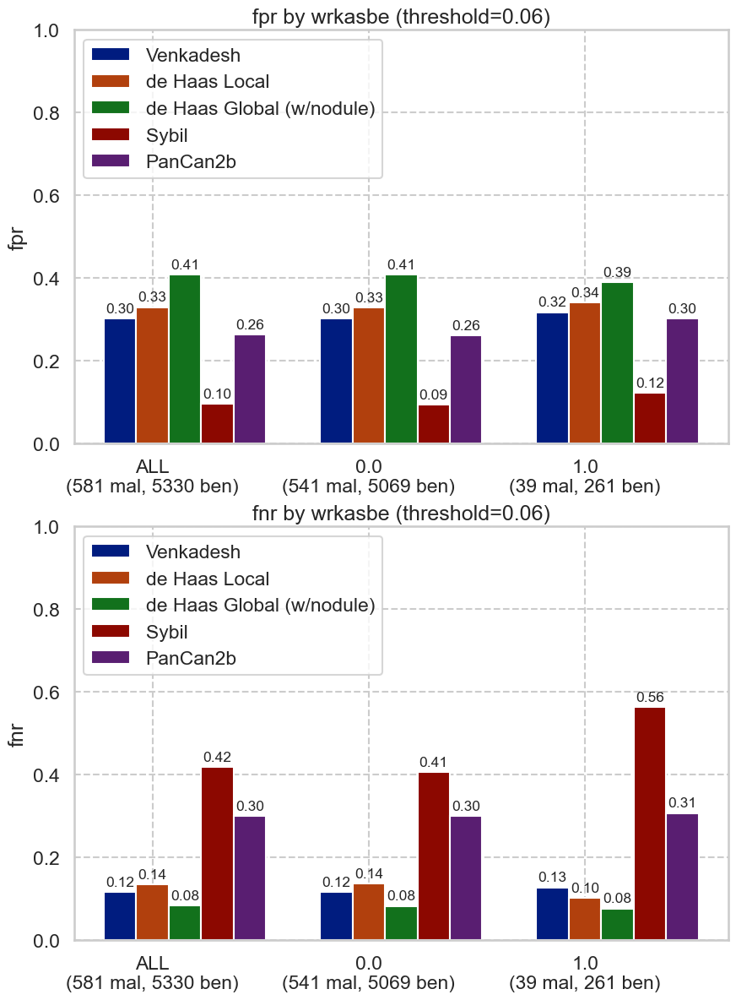

### wrkbaki

,num,pct,num_mal,pct_mal
0.0,5750,97.292724,560,9.73913
1.0,160,2.707276,20,12.50000


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


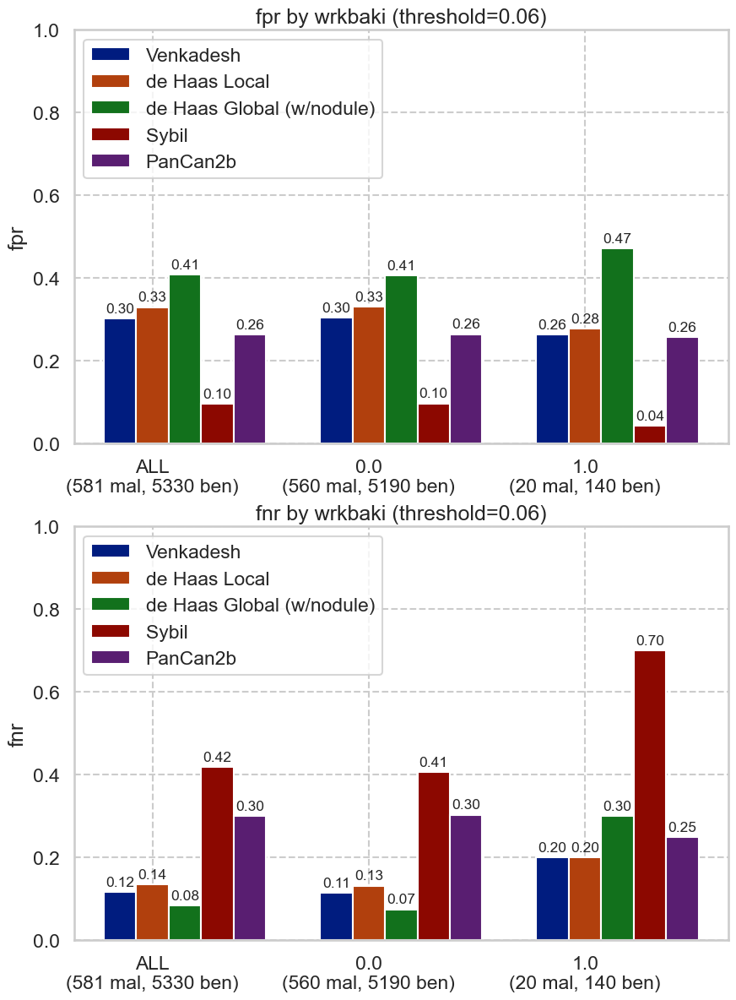

### wrkbutc

,num,pct,num_mal,pct_mal
0.0,5796,98.071066,570,9.834369
1.0,114,1.928934,10,8.771930


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


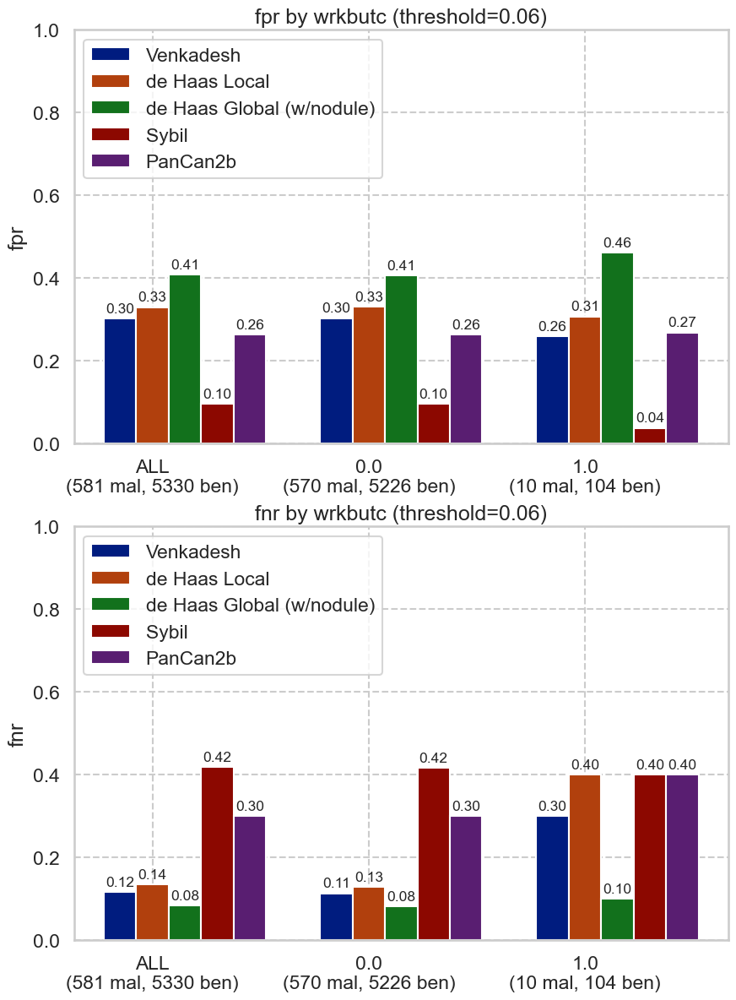

### wrkchem

,num,pct,num_mal,pct_mal
0.0,5515,93.348003,547,9.918404
1.0,393,6.651997,33,8.396947


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


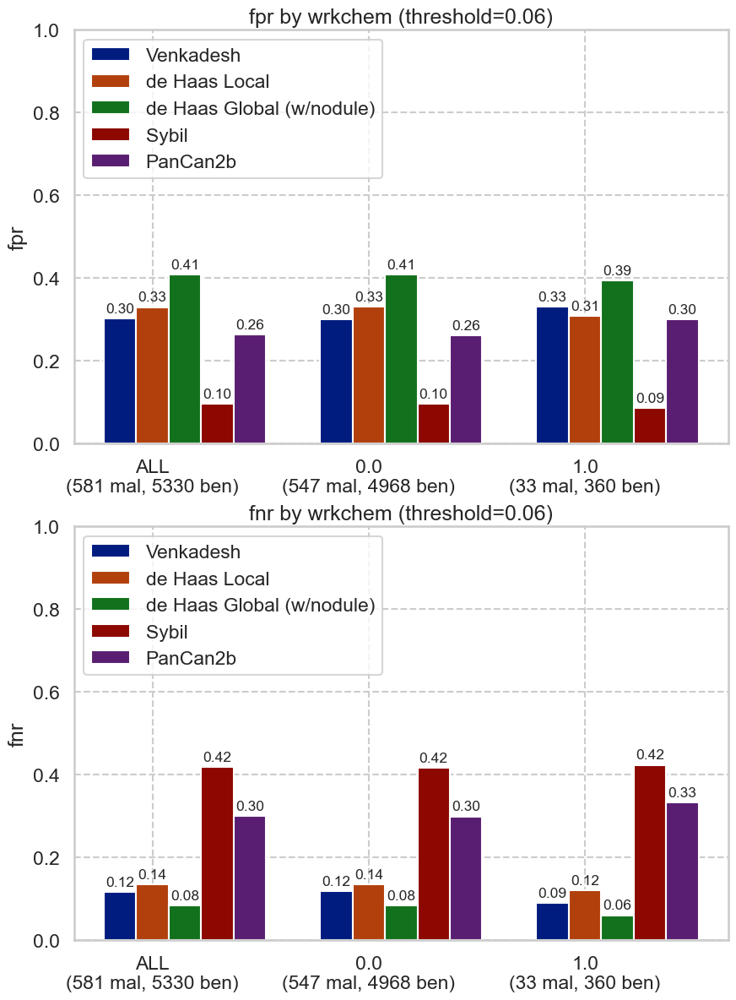

### wrkcoal

,num,pct,num_mal,pct_mal
0.0,5888,99.62775,573,9.731658
1.0,22,0.37225,7,31.818182


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


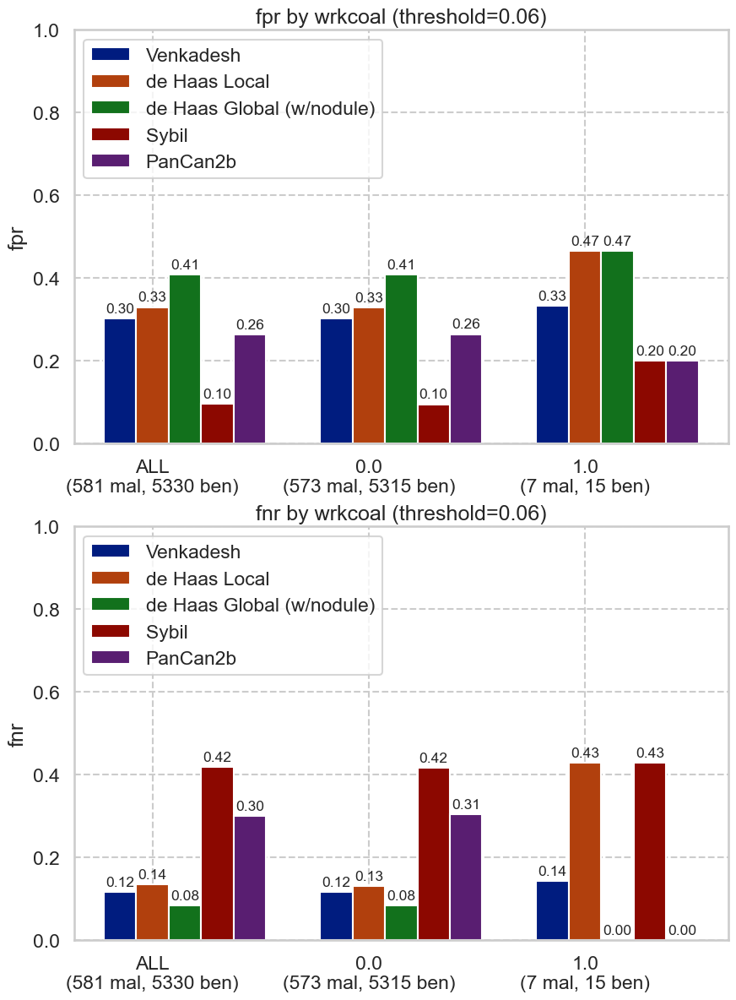

### wrkcott

,num,pct,num_mal,pct_mal
0.0,5858,99.120135,575,9.815637
1.0,52,0.879865,5,9.615385


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


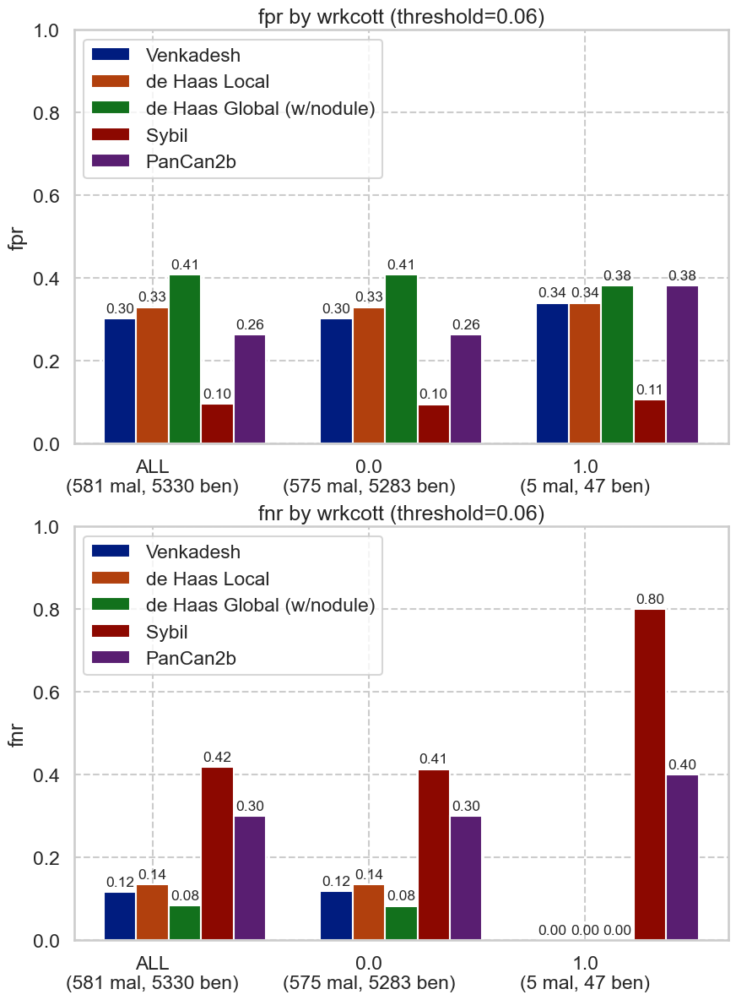

### wrkfarm

,num,pct,num_mal,pct_mal
0.0,5197,87.935702,533,10.255917
1.0,713,12.064298,47,6.591865


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


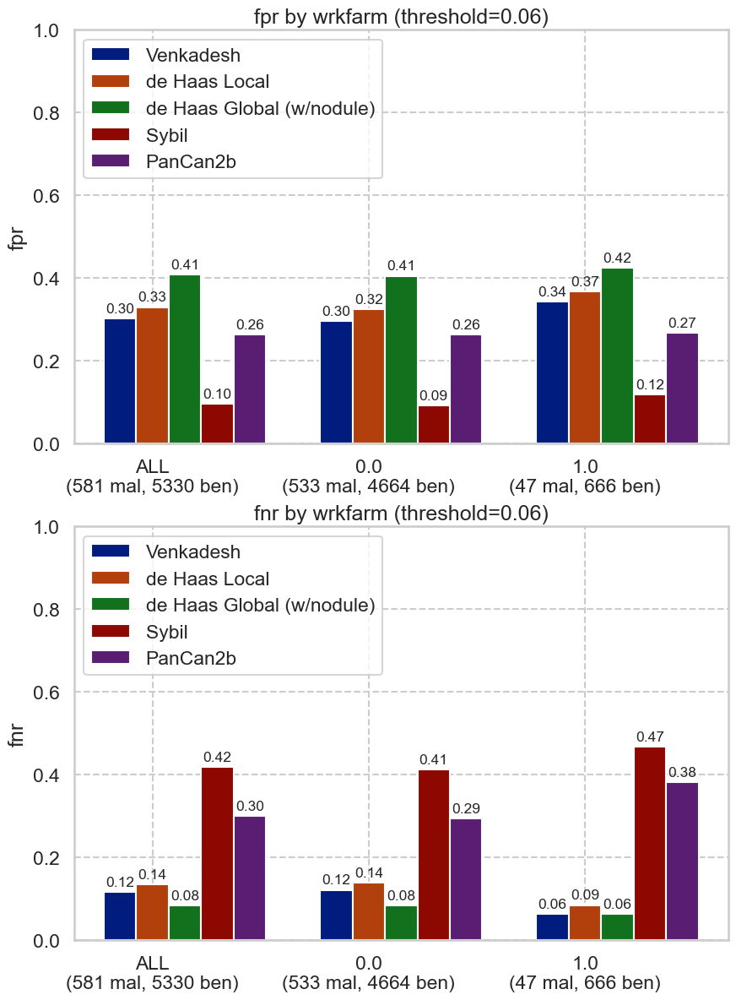

### wrkfire

,num,pct,num_mal,pct_mal
0.0,5776,97.732657,564,9.764543
1.0,134,2.267343,16,11.940299


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


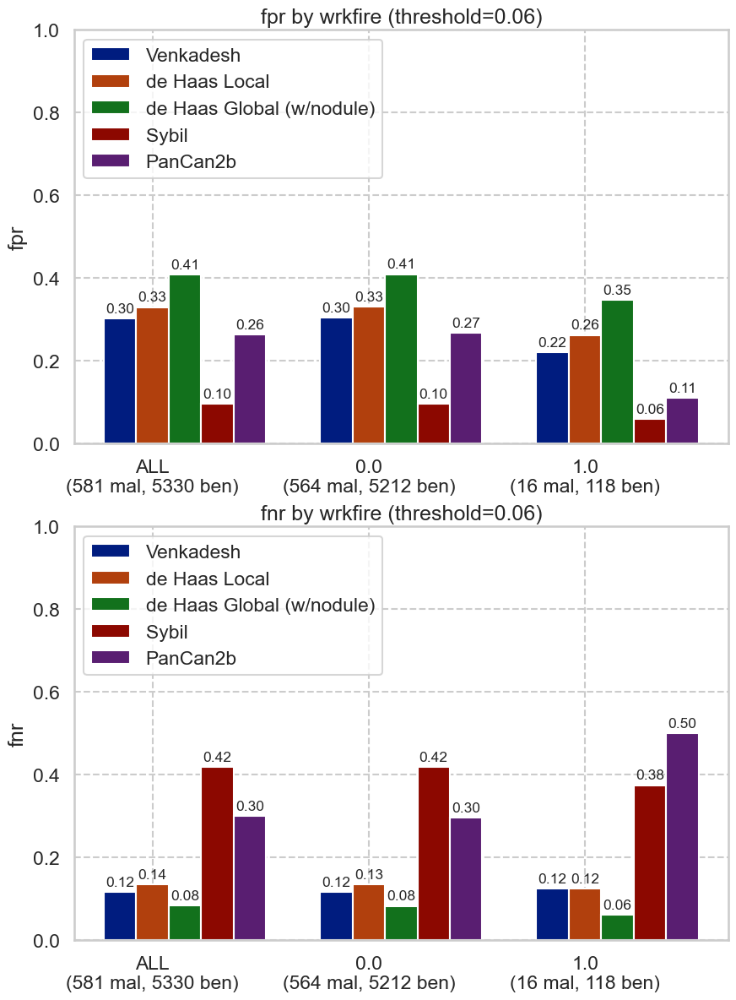

### wrkflou

,num,pct,num_mal,pct_mal
0.0,5847,98.93401,573,9.799897
1.0,63,1.06599,7,11.111111


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


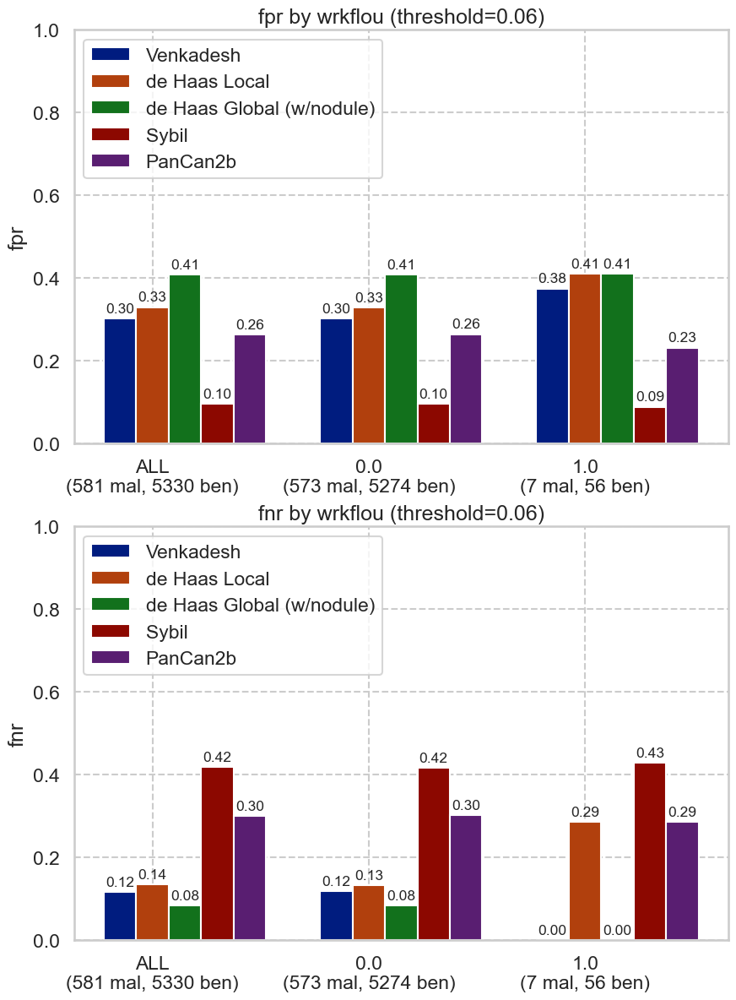

### wrkfoun

,num,pct,num_mal,pct_mal
0.0,5670,95.939086,545,9.611993
1.0,240,4.060914,35,14.583333


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


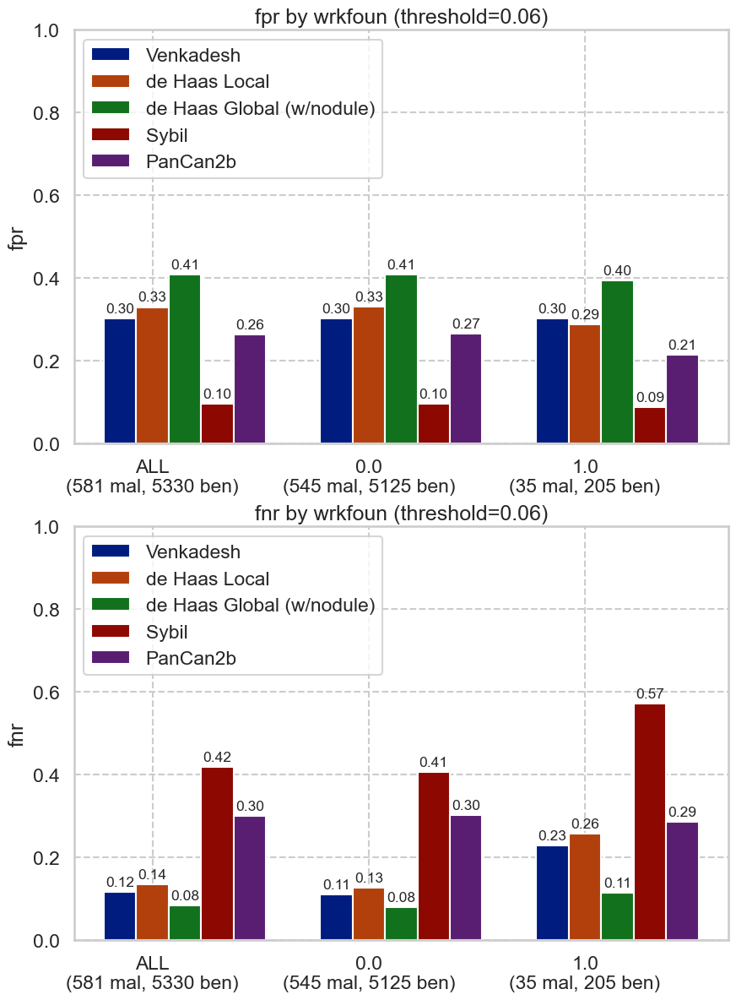

### wrkhard

,num,pct,num_mal,pct_mal
0.0,5858,99.120135,579,9.883919
1.0,52,0.879865,1,1.923077


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


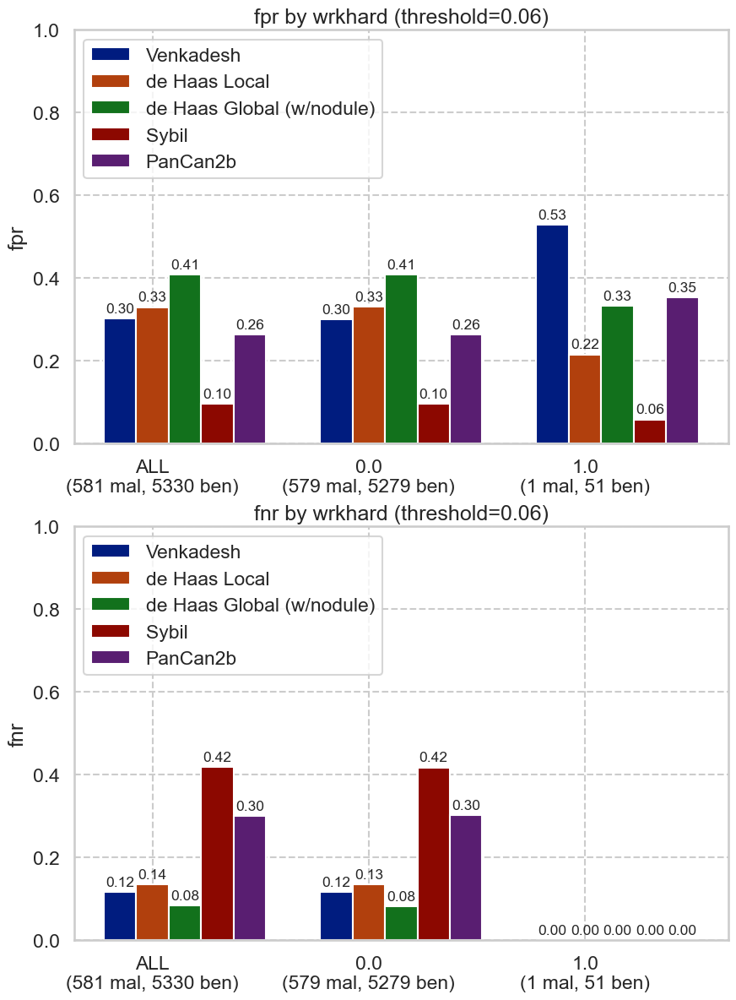

### wrkpain

,num,pct,num_mal,pct_mal
0.0,5593,94.63621,544,9.726444
1.0,317,5.36379,36,11.356467


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


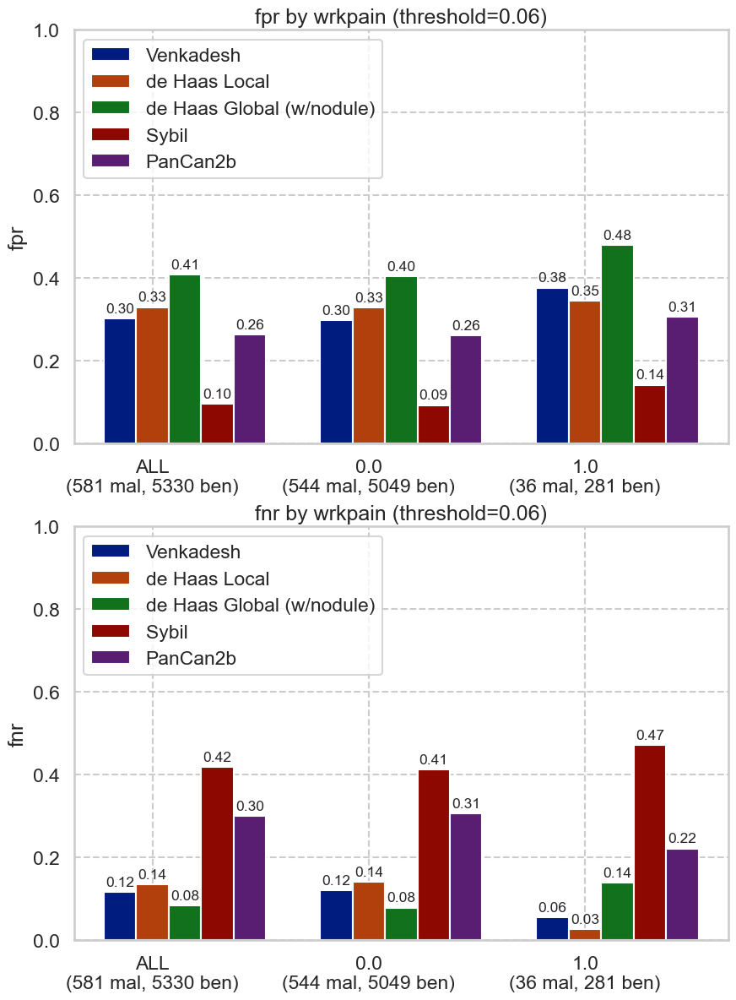

### wrksand

,num,pct,num_mal,pct_mal
0.0,5800,98.138748,558,9.62069
1.0,110,1.861252,22,20.00000


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


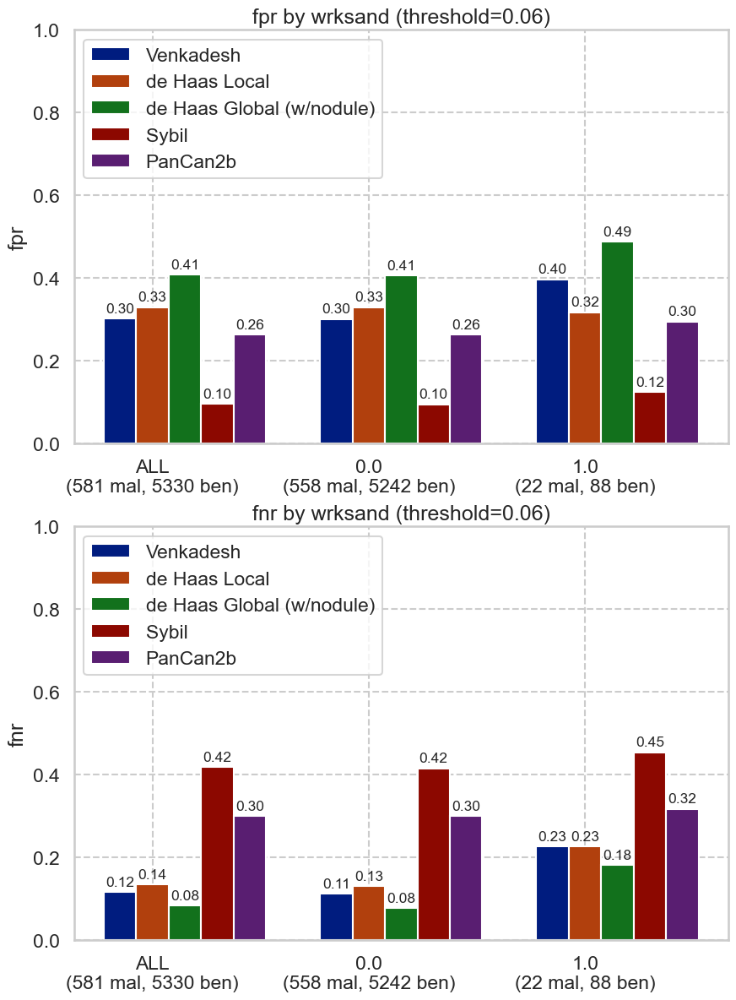

### wrkweld

,num,pct,num_mal,pct_mal
0.0,5550,93.908629,540,9.729730
1.0,360,6.091371,40,11.111111


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


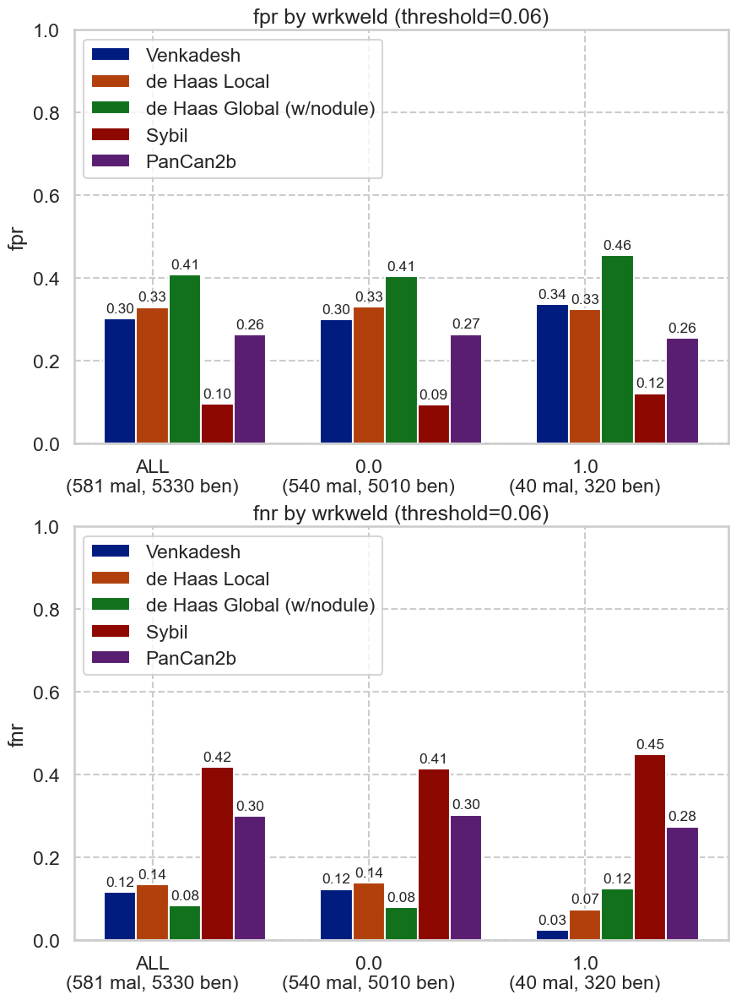

In [34]:
for cat in nlst_democols['cat']['work']:
    plot_by_category(nlst_preds, cat)

### Disease history

### Emphysema

,num,pct,num_mal,pct_mal
False,3755,63.52563,317,8.442077
True,2156,36.47437,264,12.244898


['ALL', False, True]
['ALL', False, True]


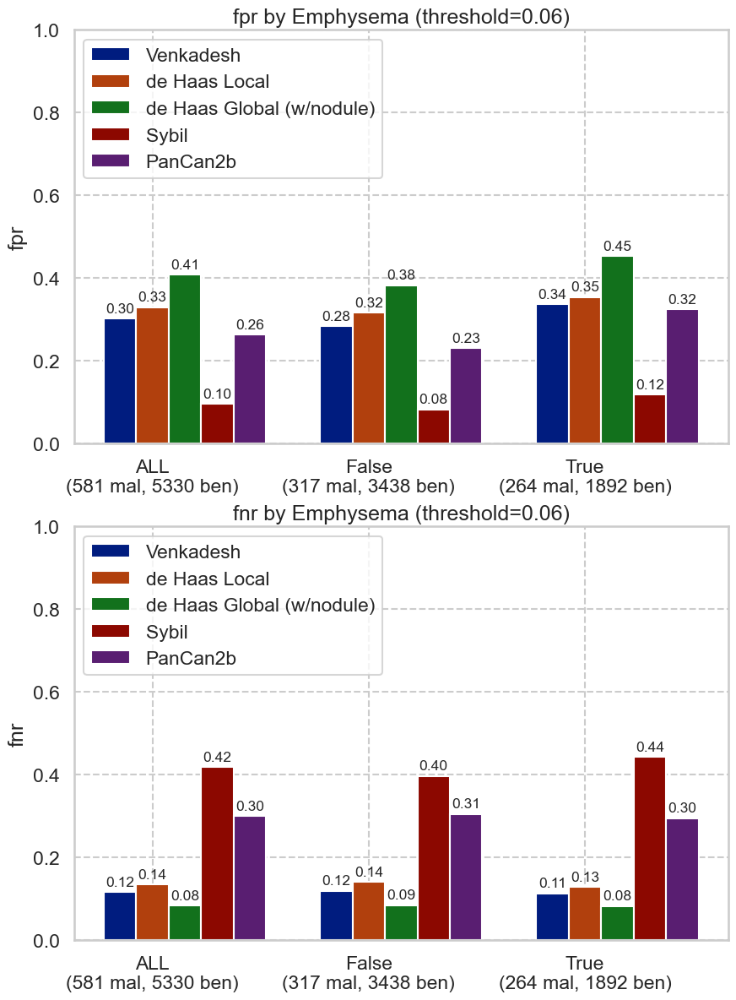

In [35]:
plot_by_category(nlst_preds, 'Emphysema')

### diagadas

,num,pct,num_mal,pct_mal
0.0,5534,93.653749,541,9.775931
1.0,375,6.346251,39,10.400000


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


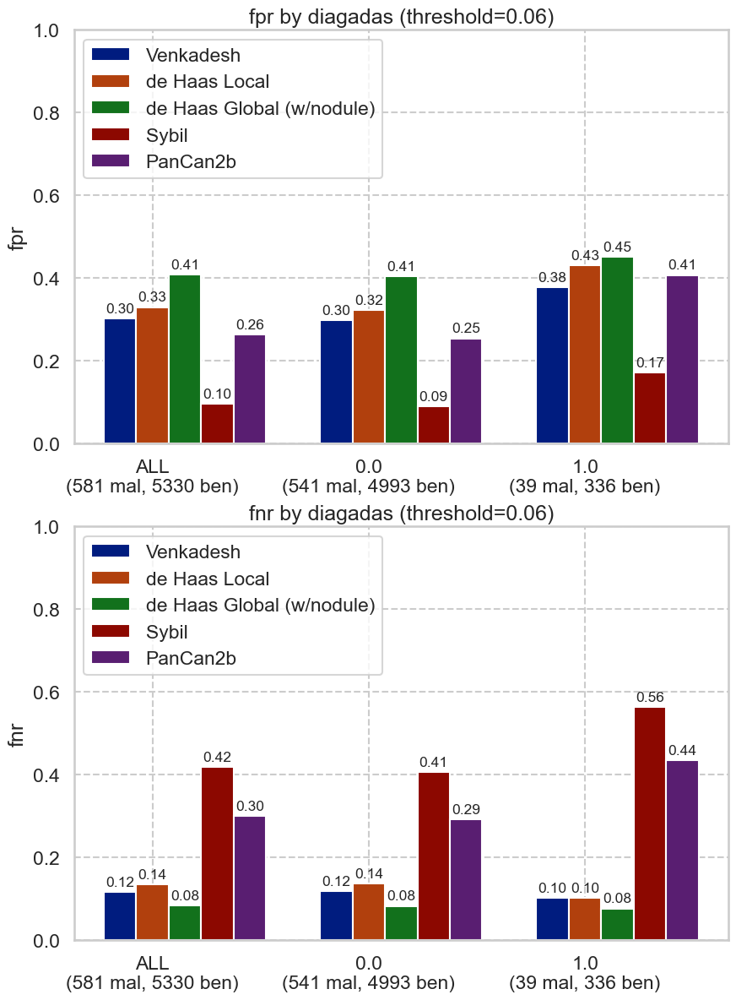

### diagasbe

,num,pct,num_mal,pct_mal
0.0,5838,98.898865,572,9.797876
1.0,65,1.101135,8,12.307692


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


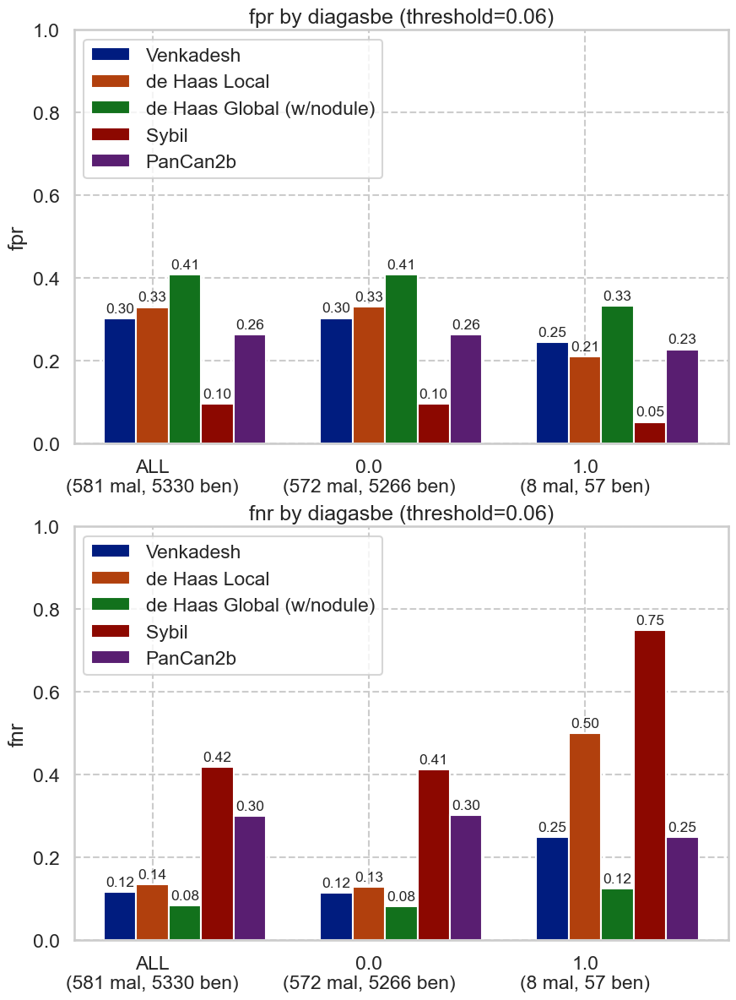

### diagbron

,num,pct,num_mal,pct_mal
0.0,5706,96.777476,564,9.884332
1.0,190,3.222524,13,6.842105


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


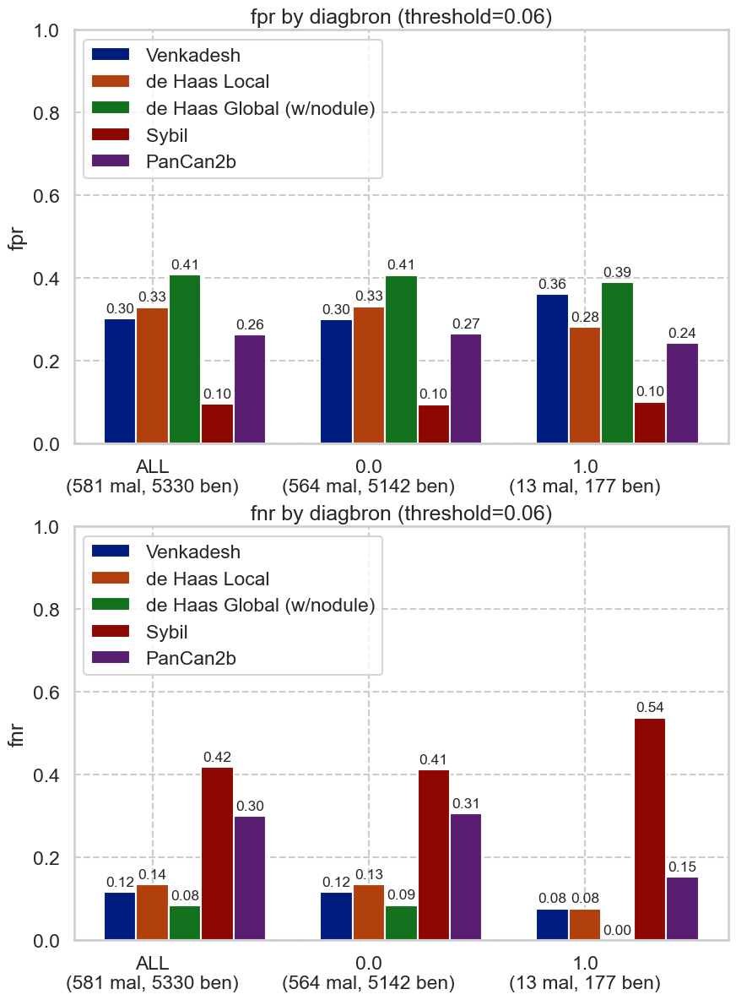

### diagchas

,num,pct,num_mal,pct_mal
0.0,5720,96.867062,566,9.895105
1.0,185,3.132938,14,7.567568


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


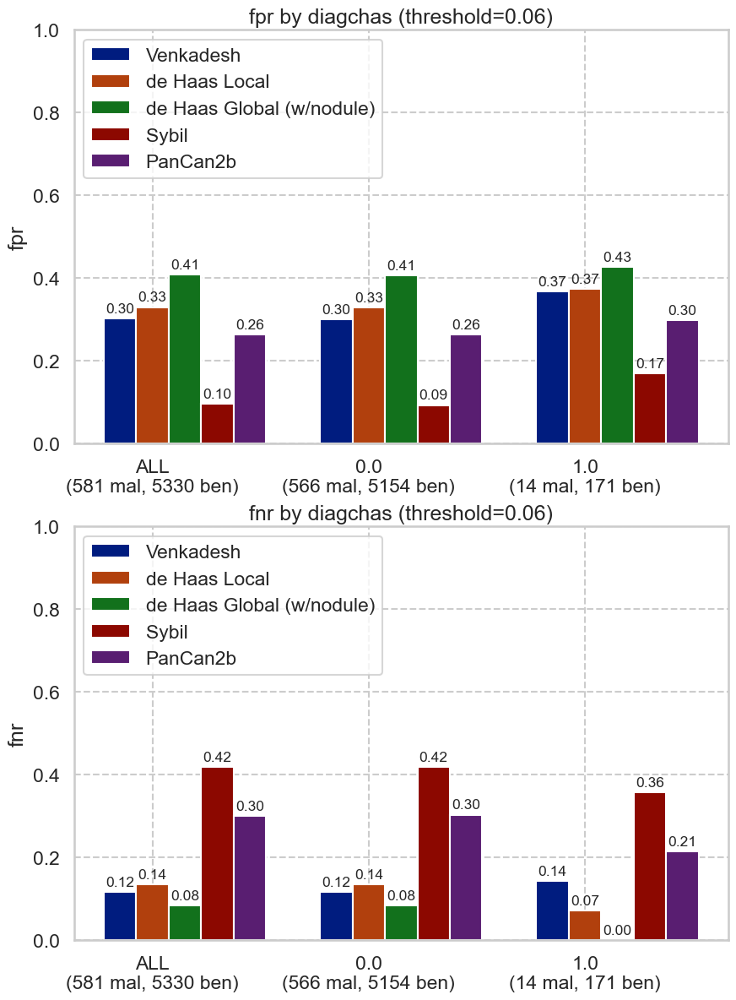

### diagchro

,num,pct,num_mal,pct_mal
0.0,5276,89.499576,521,9.874905
1.0,619,10.500424,56,9.046850


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


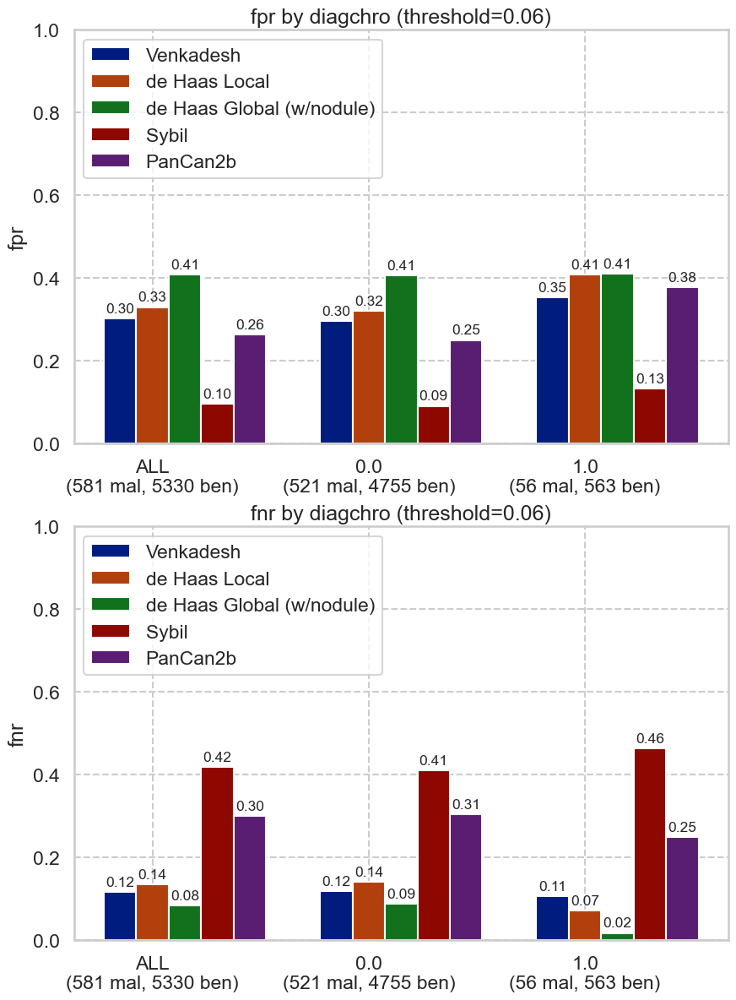

### diagcopd

,num,pct,num_mal,pct_mal
0.0,5492,93.195316,516,9.395484
1.0,401,6.804684,63,15.710723


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


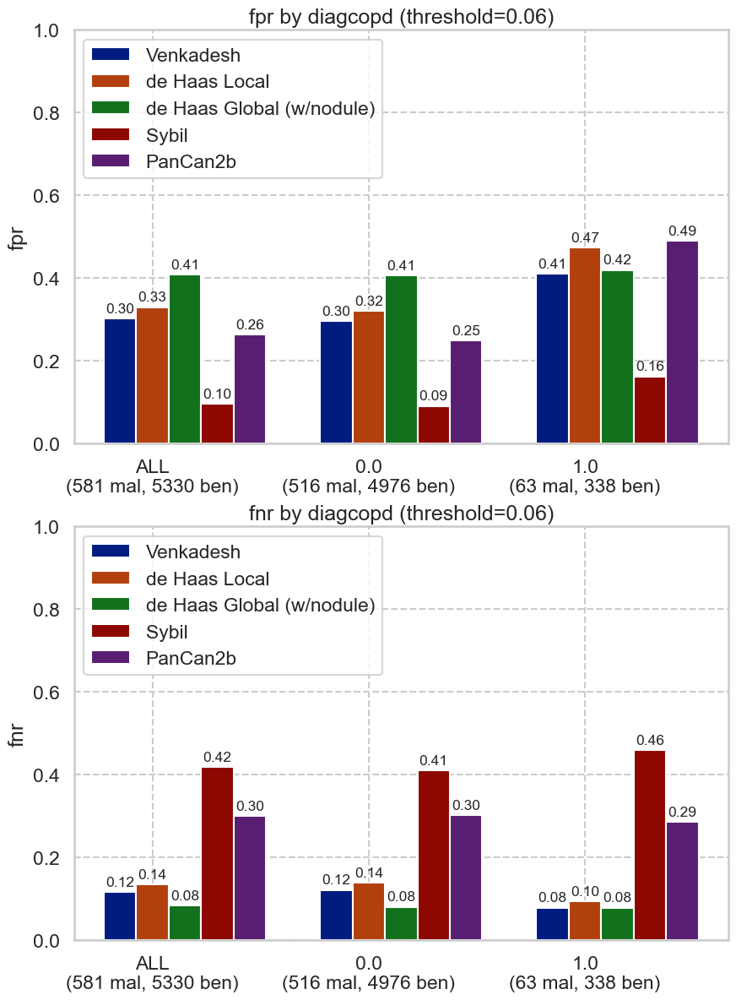

### diagdiab

,num,pct,num_mal,pct_mal
0.0,5362,90.773658,523,9.753823
1.0,545,9.226342,57,10.458716


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


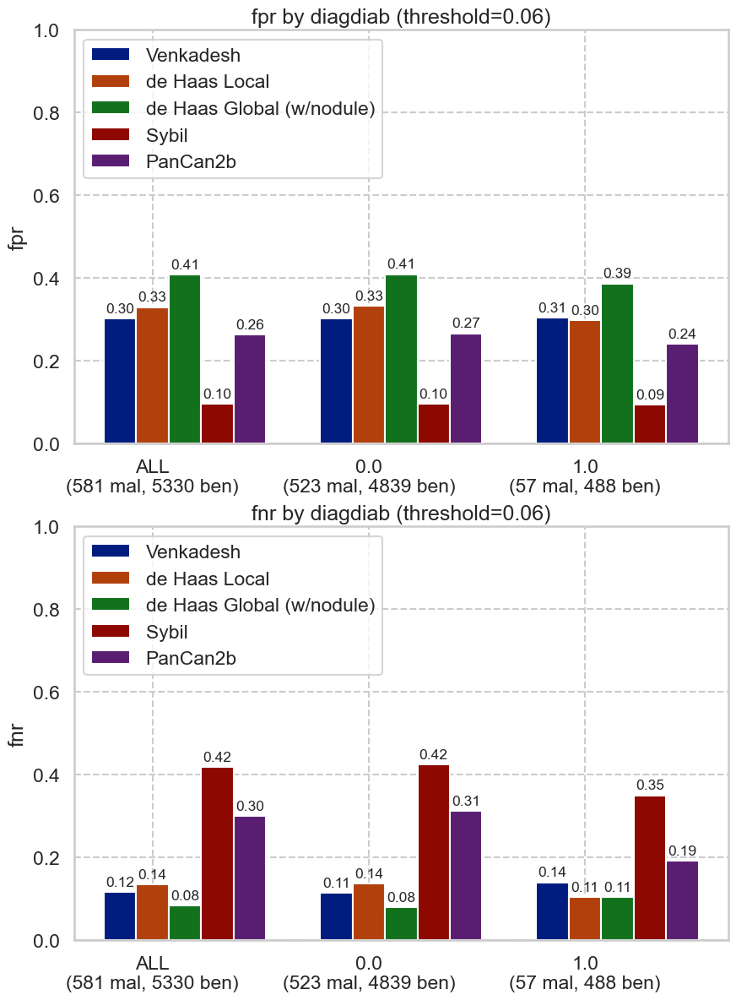

### diagemph

,num,pct,num_mal,pct_mal
0.0,5265,89.237288,497,9.439696
1.0,635,10.762712,82,12.913386


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


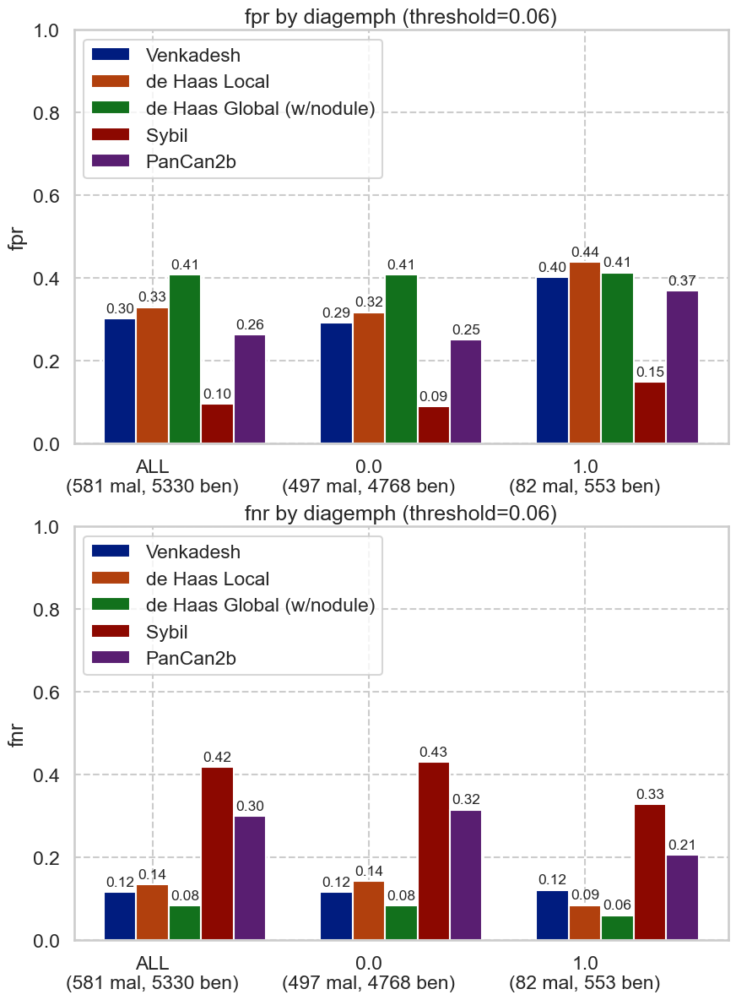

### diagfibr

,num,pct,num_mal,pct_mal
0.0,5887,99.762752,578,9.818244
1.0,14,0.237248,2,14.285714


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


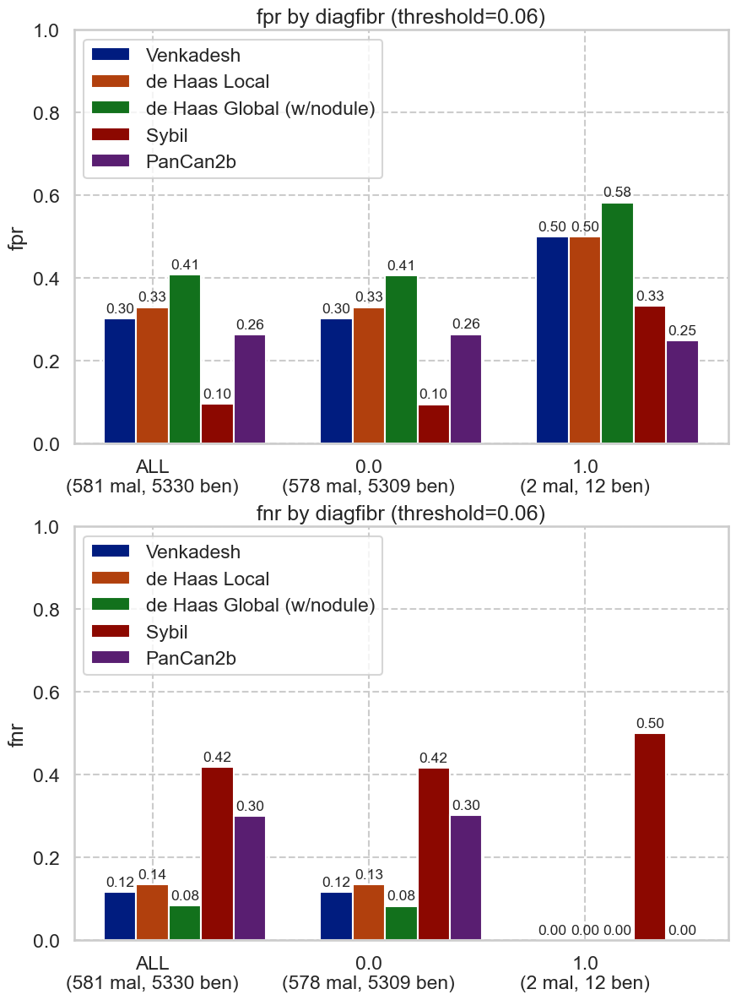

### diaghear

,num,pct,num_mal,pct_mal
0.0,5087,86.381389,492,9.671712
1.0,802,13.618611,87,10.847880


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


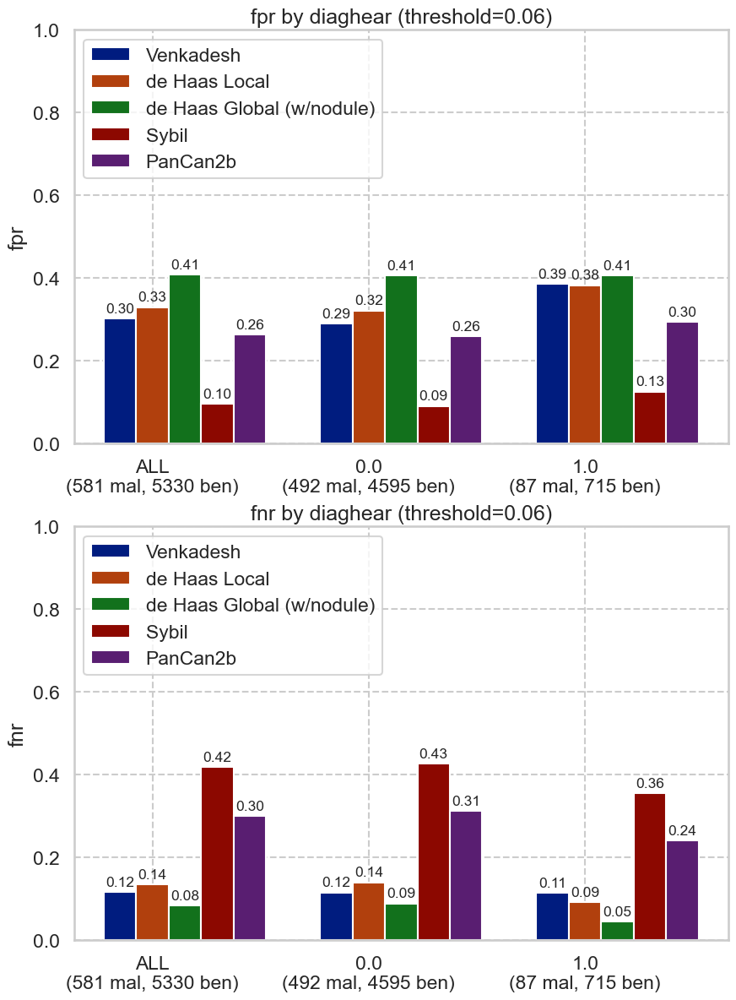

### diaghype

,num,pct,num_mal,pct_mal
0.0,3909,66.231786,352,9.004861
1.0,1993,33.768214,223,11.189162


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


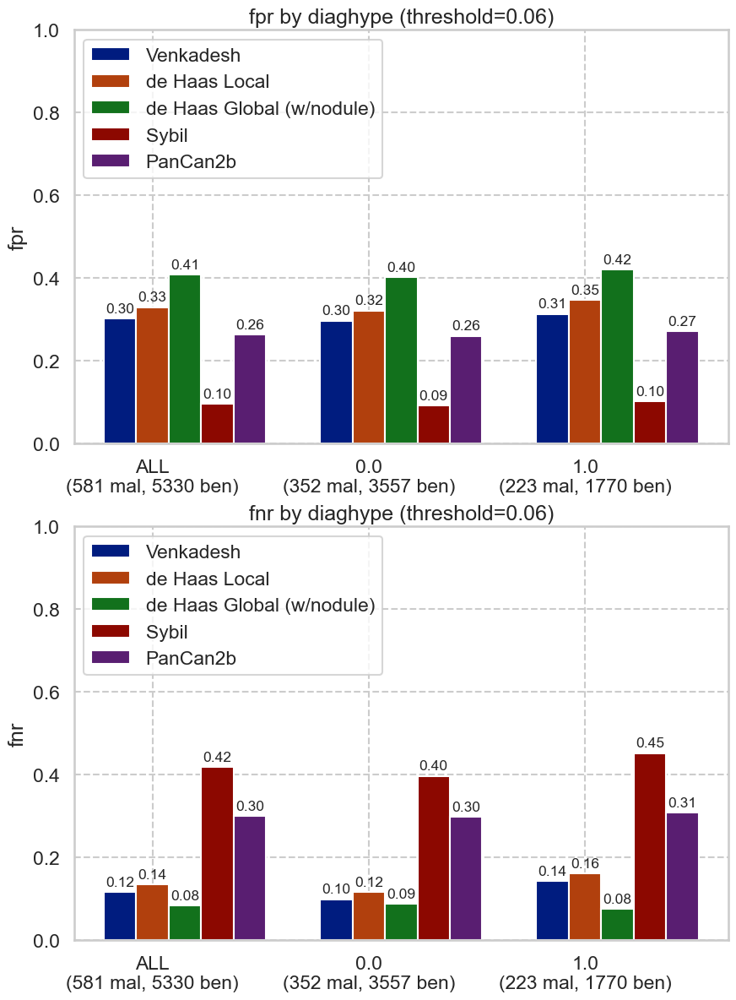

### diagpneu

,num,pct,num_mal,pct_mal
0.0,4514,76.56038,438,9.703146
1.0,1382,23.43962,136,9.840810


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


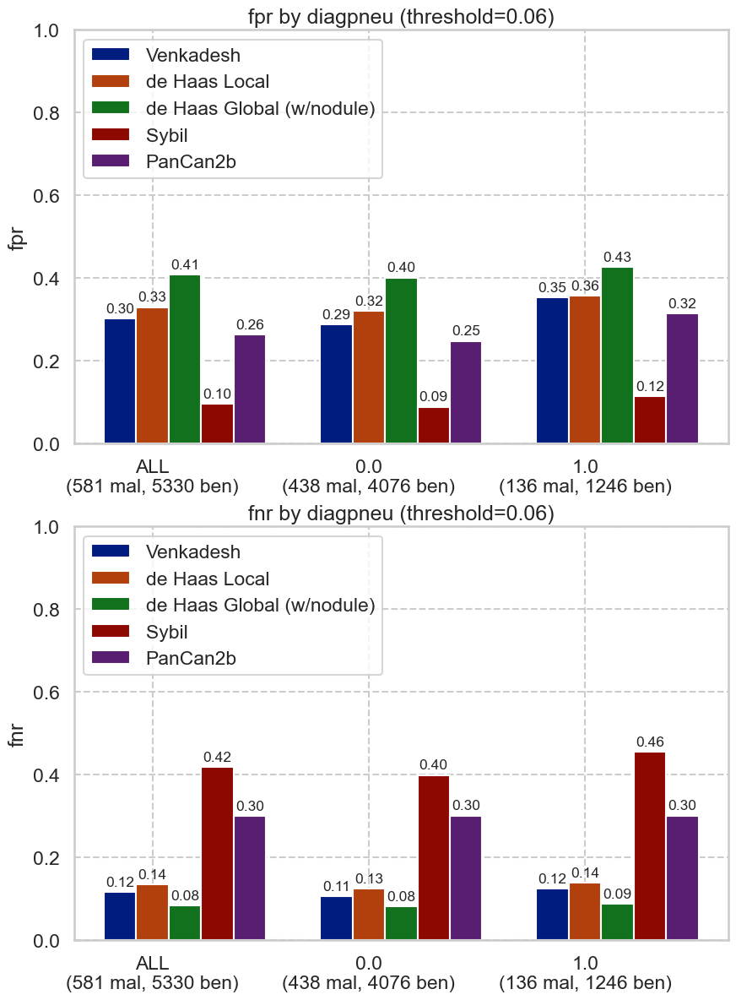

### diagsarc

,num,pct,num_mal,pct_mal
0.0,5889,99.83048,576,9.780948
1.0,10,0.16952,2,20.000000


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


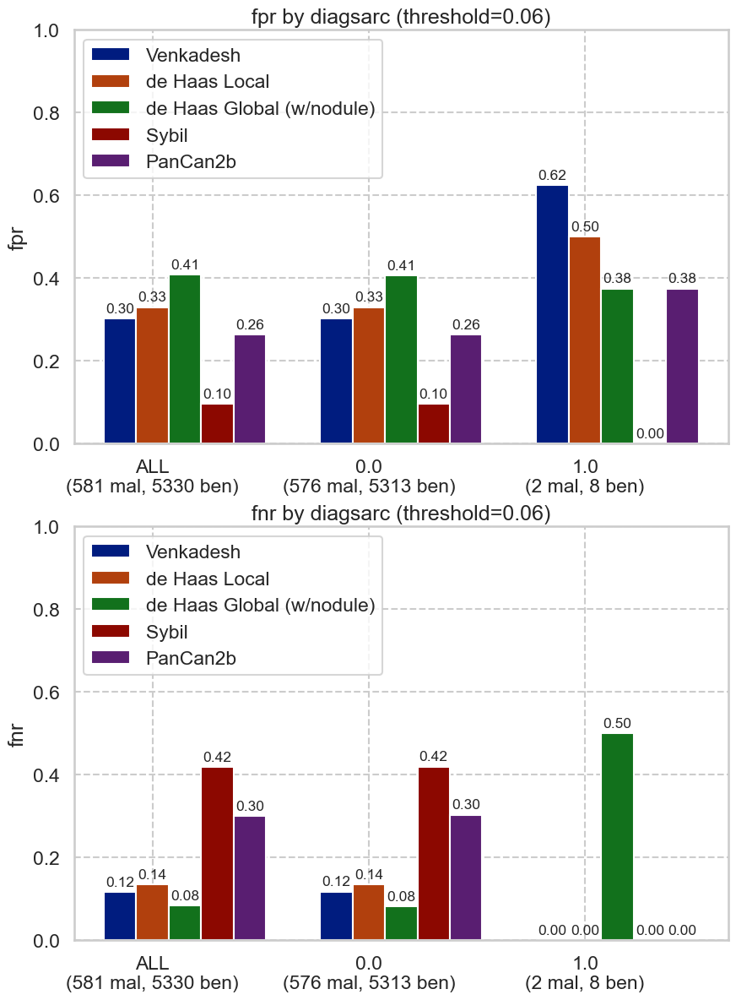

### diagsili

,num,pct,num_mal,pct_mal
0.0,5887,99.796576,574,9.750297
1.0,12,0.203424,4,33.333333


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


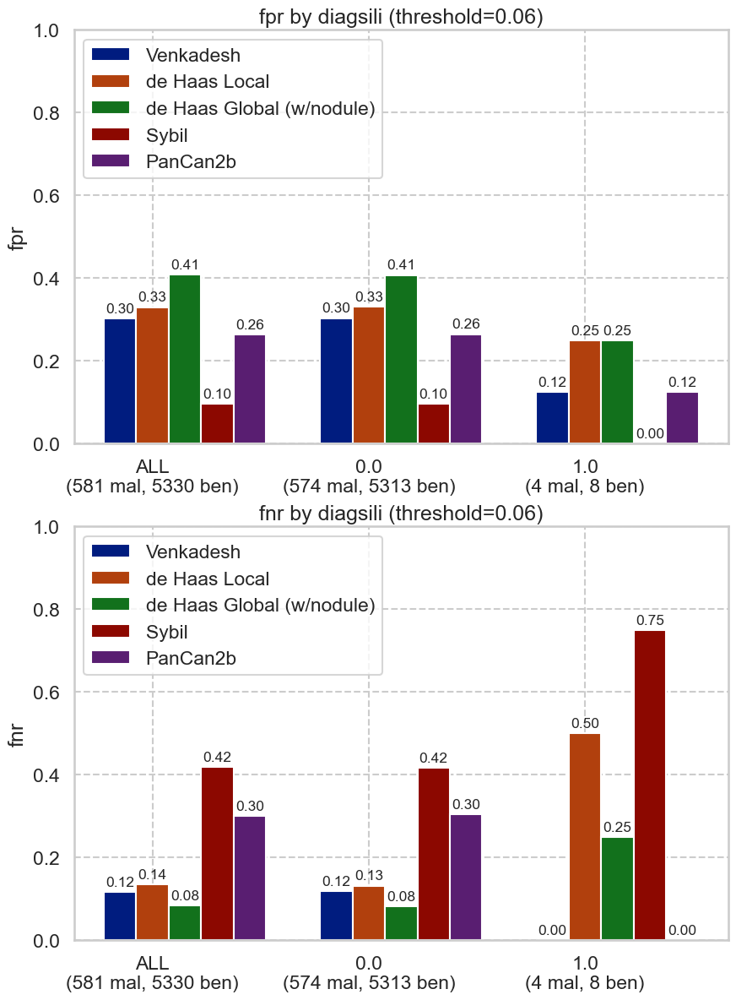

### diagstro

,num,pct,num_mal,pct_mal
0.0,5710,96.681341,556,9.737303
1.0,196,3.318659,24,12.244898


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


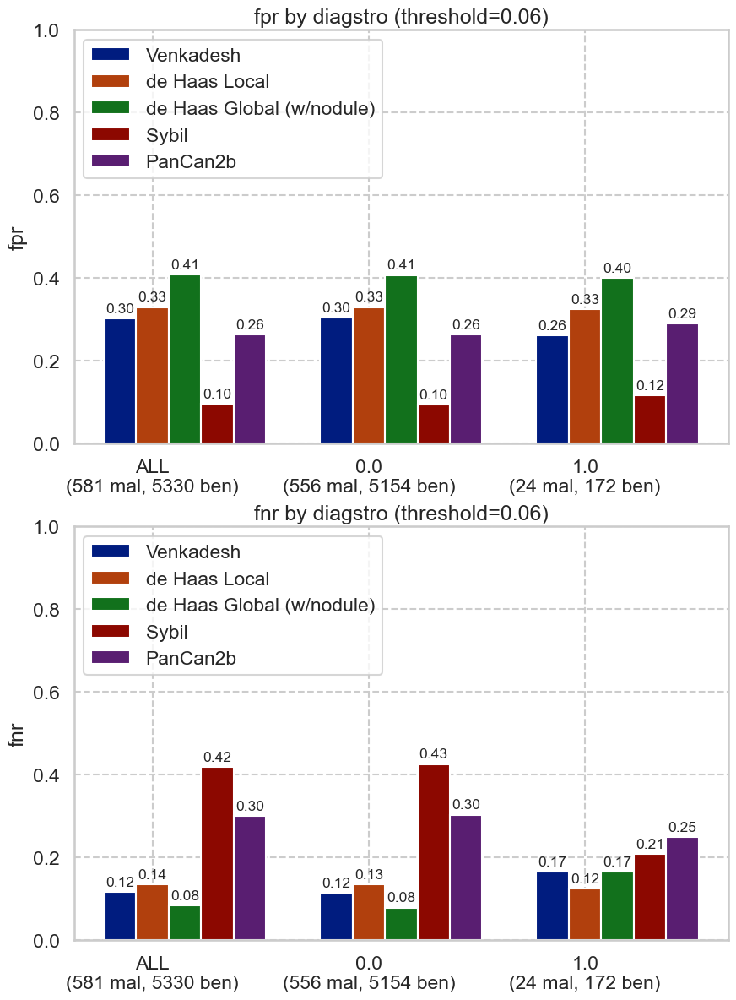

### diagtube

,num,pct,num_mal,pct_mal
0.0,5839,98.882303,569,9.744819
1.0,66,1.117697,11,16.666667


['ALL', 0.0, 1.0]
['ALL', 0.0, 1.0]


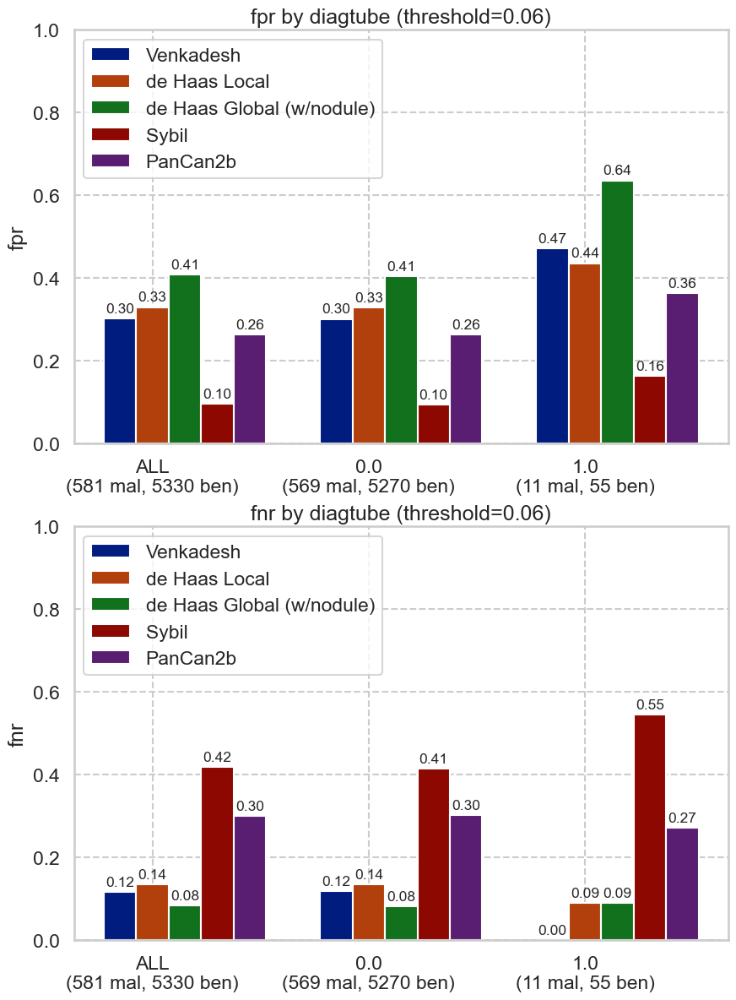

In [36]:
for cat in nlst_democols['cat']['disease']:
    plot_by_category(nlst_preds, cat)

### Lung cancer types

### Small_cell_carcinoma

,num,pct,num_mal,pct_mal
False,5889,99.627813,559,9.492274
True,22,0.372187,22,100.000000


['ALL', False]
['ALL', False]


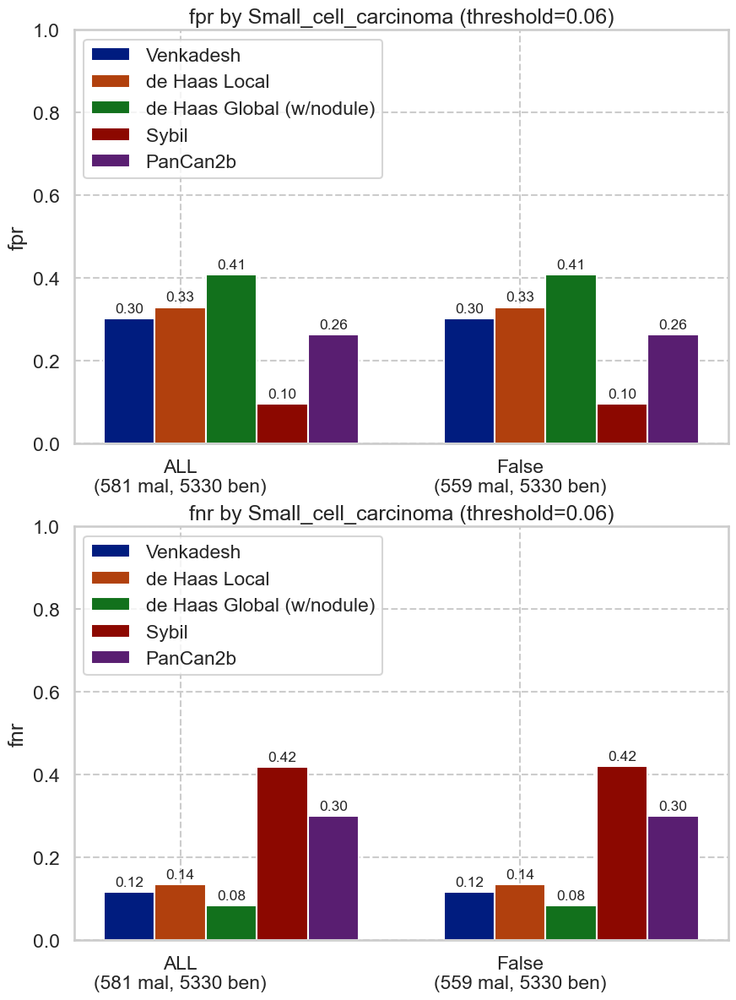

### Squamous_cell_carcinoma

,num,pct,num_mal,pct_mal
False,5791,97.969887,461,7.960629
True,120,2.030113,120,100.000000


['ALL', False]
['ALL', False]


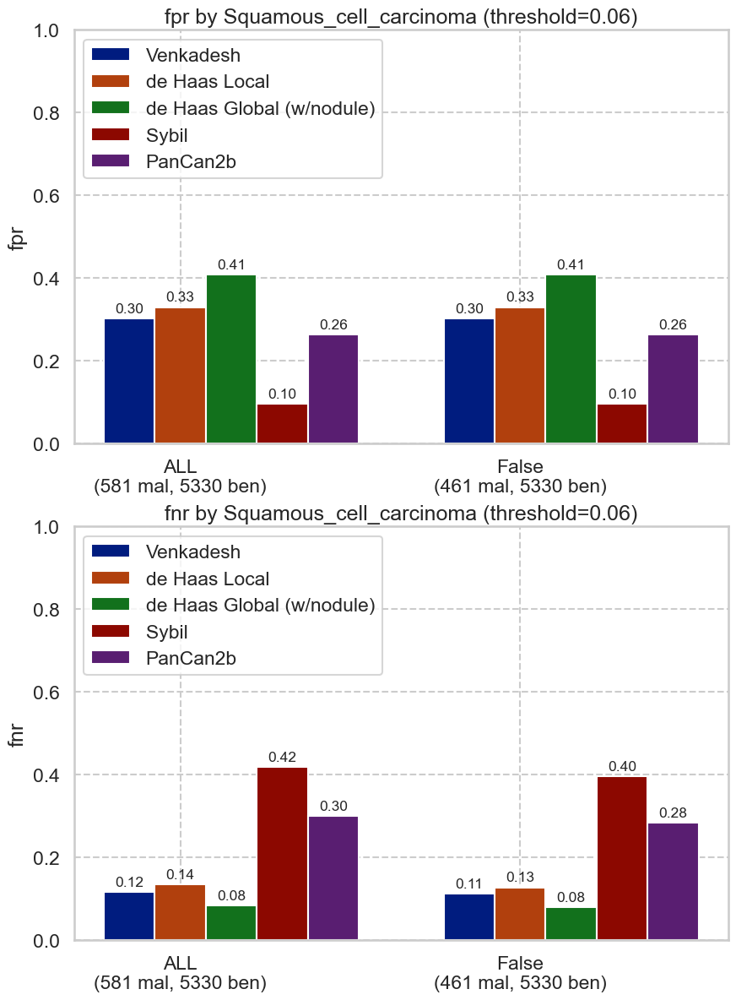

### Adenocarcinoma

,num,pct,num_mal,pct_mal
False,5678,96.058197,348,6.128919
True,233,3.941803,233,100.000000


['ALL', False]
['ALL', False]


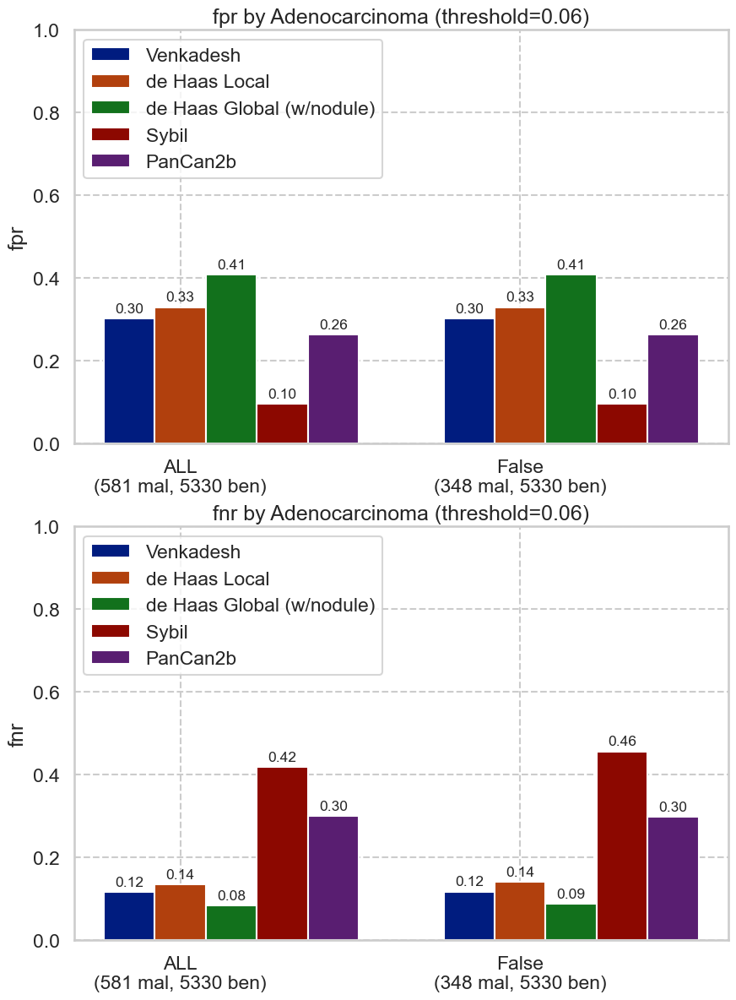

### Bronchiolo-alveolar_carcinoma

,num,pct,num_mal,pct_mal
False,5813,98.342074,483,8.308963
True,98,1.657926,98,100.000000


['ALL', False]
['ALL', False]


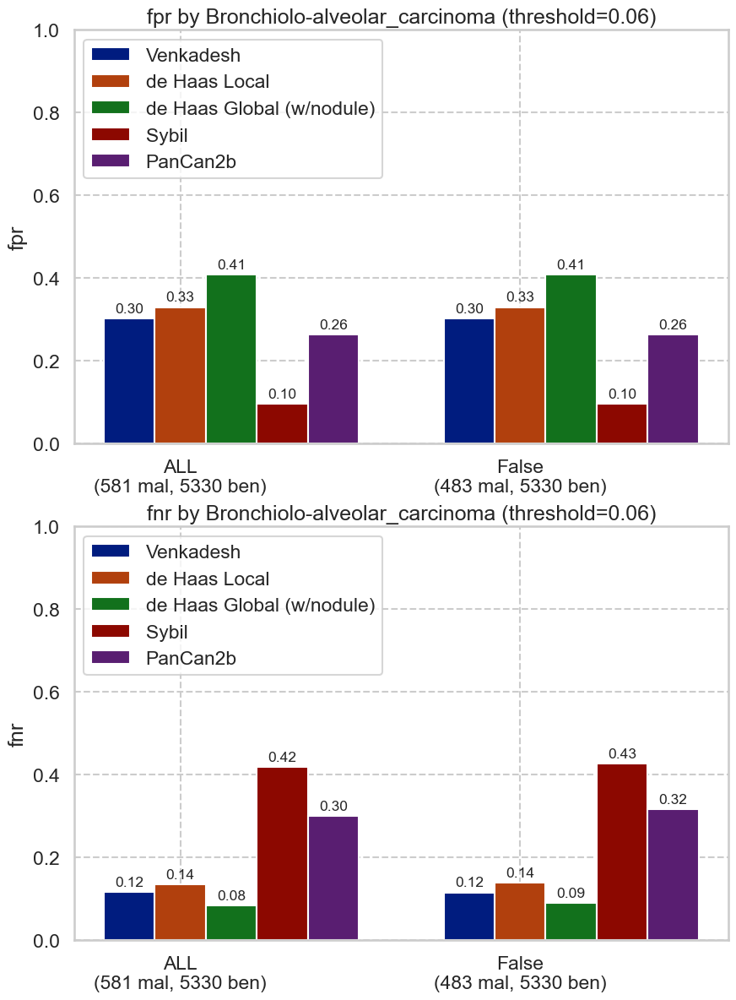

### Large_cell_carcinoma

,num,pct,num_mal,pct_mal
False,5892,99.678565,562,9.538357
True,19,0.321435,19,100.000000


['ALL', False]
['ALL', False]


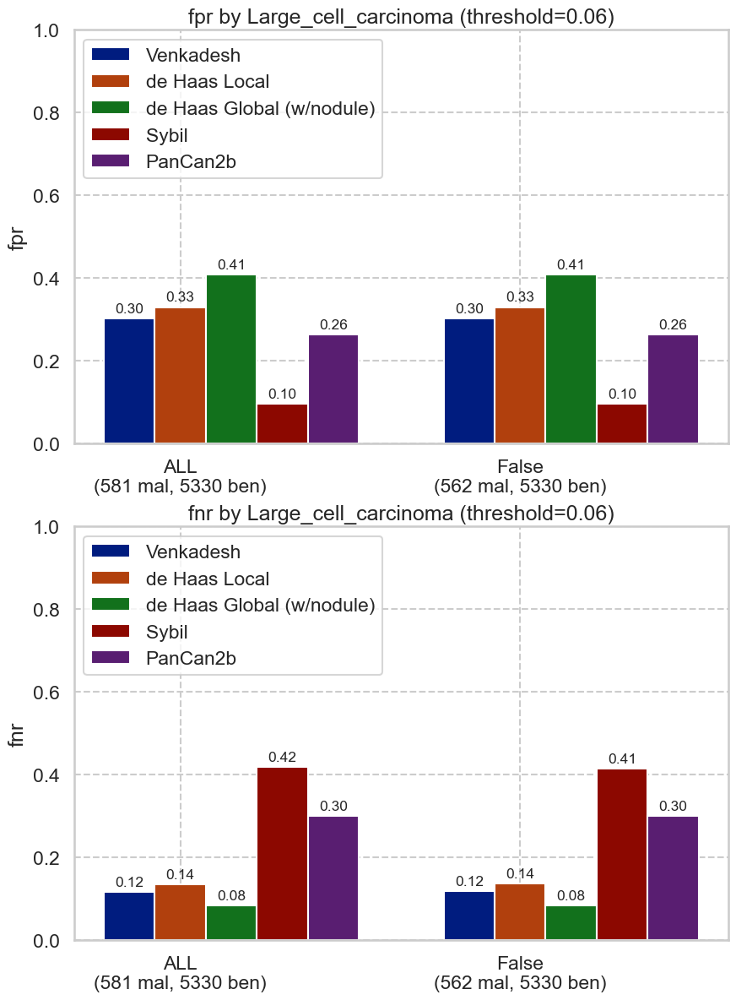

### Adenosquamous_carcinoma

,num,pct,num_mal,pct_mal
False,5905,99.898494,575,9.737511
True,6,0.101506,6,100.000000


['ALL', False]
['ALL', False]


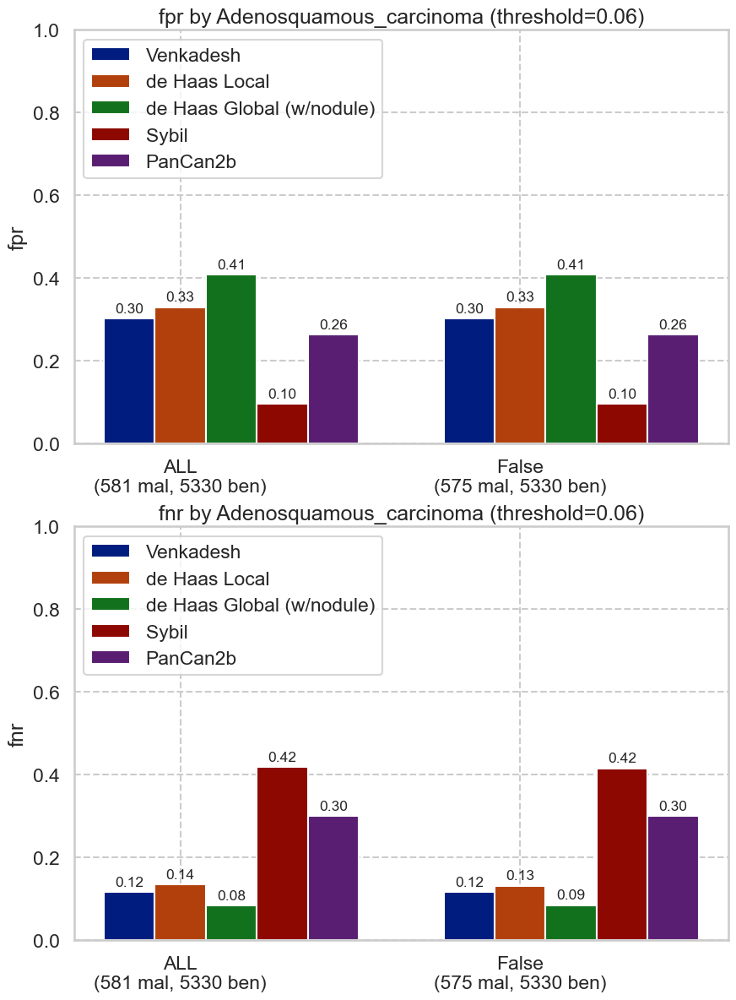

### Carcinoid_tumor

,num,pct,num_mal,pct_mal
False,5905,99.898494,575,9.737511
True,6,0.101506,6,100.000000


['ALL', False]
['ALL', False]


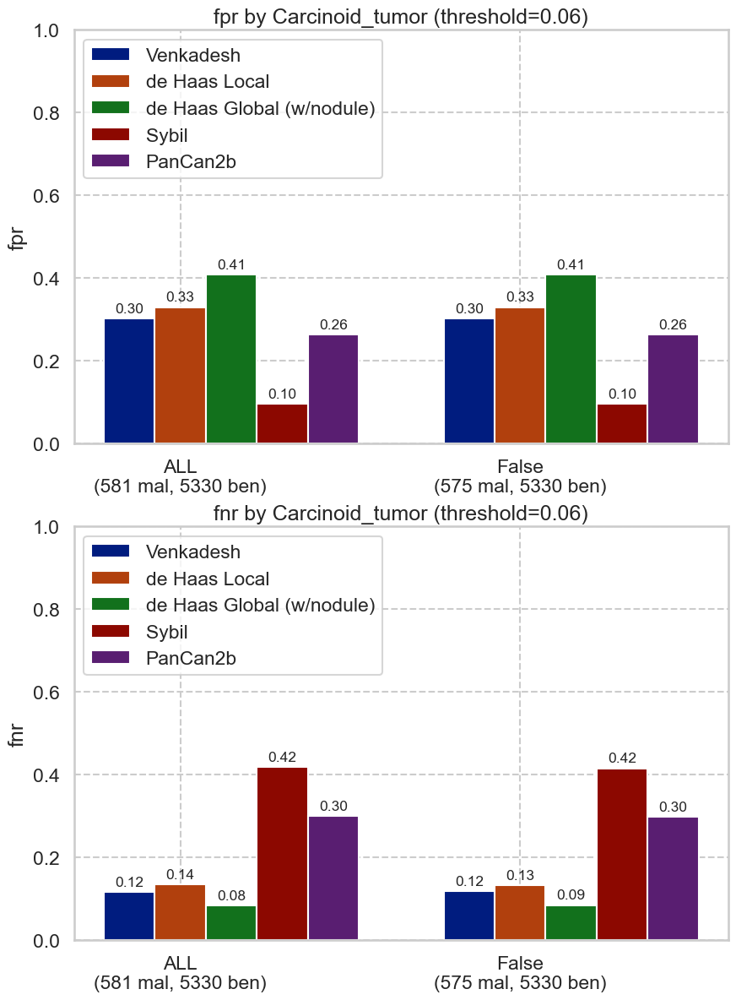

### Unclassified_carcinoma

,num,pct,num_mal,pct_mal
False,5840,98.79885,510,8.732877
True,71,1.20115,71,100.000000


['ALL', False]
['ALL', False]


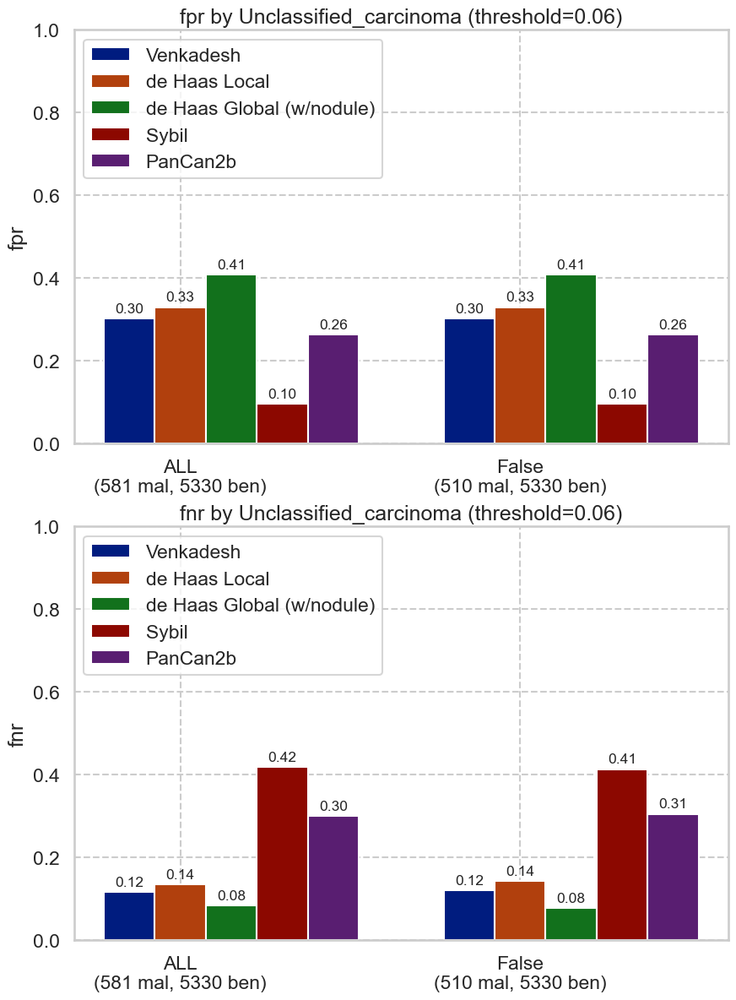

In [37]:
for cat in nlst_democols['cat']['lungcanc']:
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

#### height

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5322.0,67.992108,3.975060,53.0,65.0,68.0,71.0,83.0
1,579.0,67.867012,3.938709,59.0,65.0,68.0,71.0,76.0


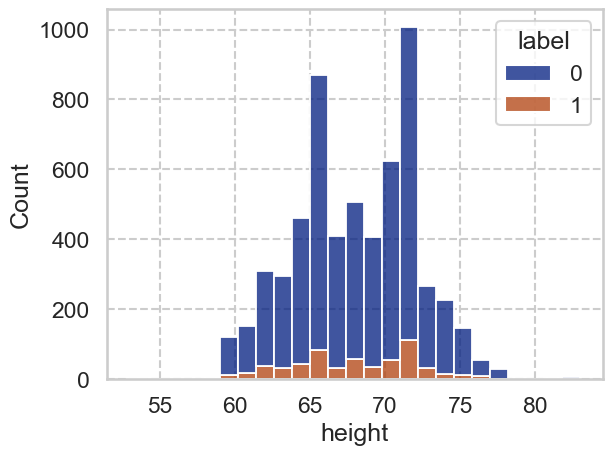

#### weight

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5323.0,182.510802,39.453415,75.0,155.0,180.0,205.0,368.0
1,575.0,176.481739,36.847637,95.0,150.0,175.0,200.0,322.0


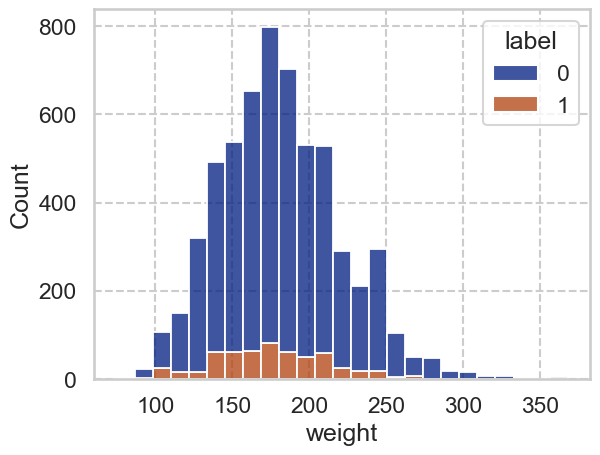

#### Age

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,63.088180,5.263707,54.0,59.0,62.0,67.0,76.0
1,581.0,64.061962,5.202746,55.0,60.0,64.0,68.0,76.0


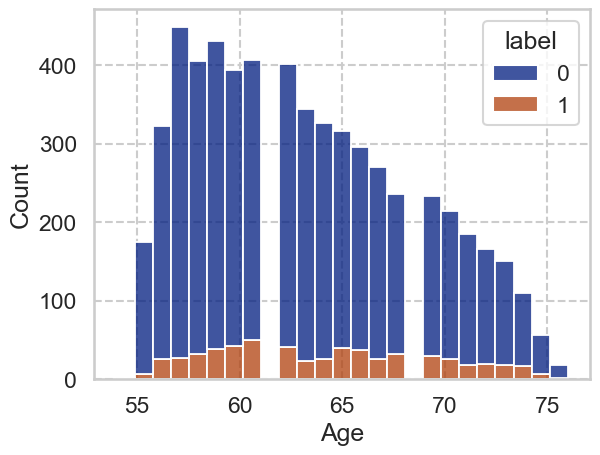

#### BMI

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5318.0,27.63764,4.984482,13.284203,24.209972,27.005931,30.550293,57.630653
1,574.0,26.79225,4.402291,16.432432,24.207989,26.172647,29.049587,47.587692


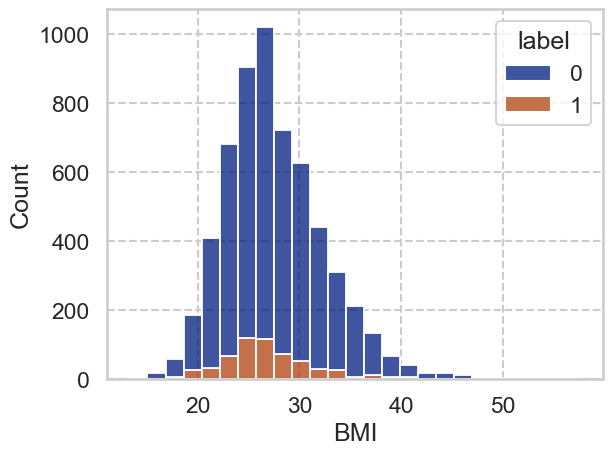

In [38]:
for c in nlst_democols['num']['demo']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_13928\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               height  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_height                                                                    
(52.999, 68.0]  3134.0  0.099553  0.299451  0.0  0.0  0.0  0.0  1.0  3134.0   
(68.0, 83.0]    2767.0  0.096494  0.295321  0.0  0.0  0.0  0.0  1.0  2767.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_height                                                         
(52.999, 68.0]  64.869177  2.355045  53.0  63.0  65.0  67.0  68.0  
(68.0, 83.0]    71.503072  1.994545  69.0  70.0  71.0  73.0  83.0

### bin_height

C:\Users\shaur\AppData\Local\Temp\ipykernel_13928\1626763021.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,num_mal,pct_mal
"(52.999, 68.0]",3134,53.109642,312,9.955329
"(68.0, 83.0]",2767,46.890358,267,9.649440


['ALL', Interval(52.999, 68.0, closed='right'), Interval(68.0, 83.0, closed='right')]
['ALL', Interval(52.999, 68.0, closed='right'), Interval(68.0, 83.0, closed='right')]


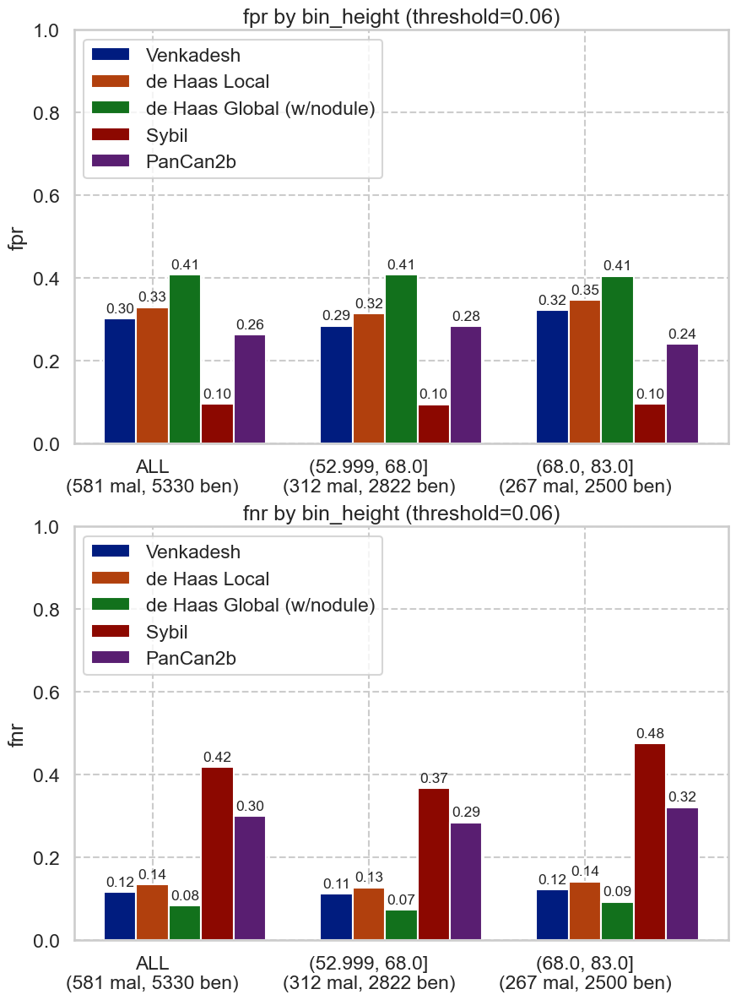

C:\Users\shaur\AppData\Local\Temp\ipykernel_13928\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               weight  \
                  count      mean       std  min  25%  50%  75%  max   count   
bin_weight                                                                     
(74.999, 180.0]  3082.0  0.106424  0.308430  0.0  0.0  0.0  0.0  1.0  3082.0   
(180.0, 368.0]   2816.0  0.087713  0.282927  0.0  0.0  0.0  0.0  1.0  2816.0   

                                                                           
                       mean        std    min    25%    50%    75%    max  
bin_weight                                                                 
(74.999, 180.0]  152.228423  20.400591   75.0  139.0  155.0  170.0  180.0  
(180.0, 368.0]   214.422585  27.365632  181.0  193.0  208.0  230.0  368.0

### bin_weight

C:\Users\shaur\AppData\Local\Temp\ipykernel_13928\1626763021.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,num_mal,pct_mal
"(74.999, 180.0]",3082,52.255002,328,10.642440
"(180.0, 368.0]",2816,47.744998,247,8.771307


['ALL', Interval(74.999, 180.0, closed='right'), Interval(180.0, 368.0, closed='right')]
['ALL', Interval(74.999, 180.0, closed='right'), Interval(180.0, 368.0, closed='right')]


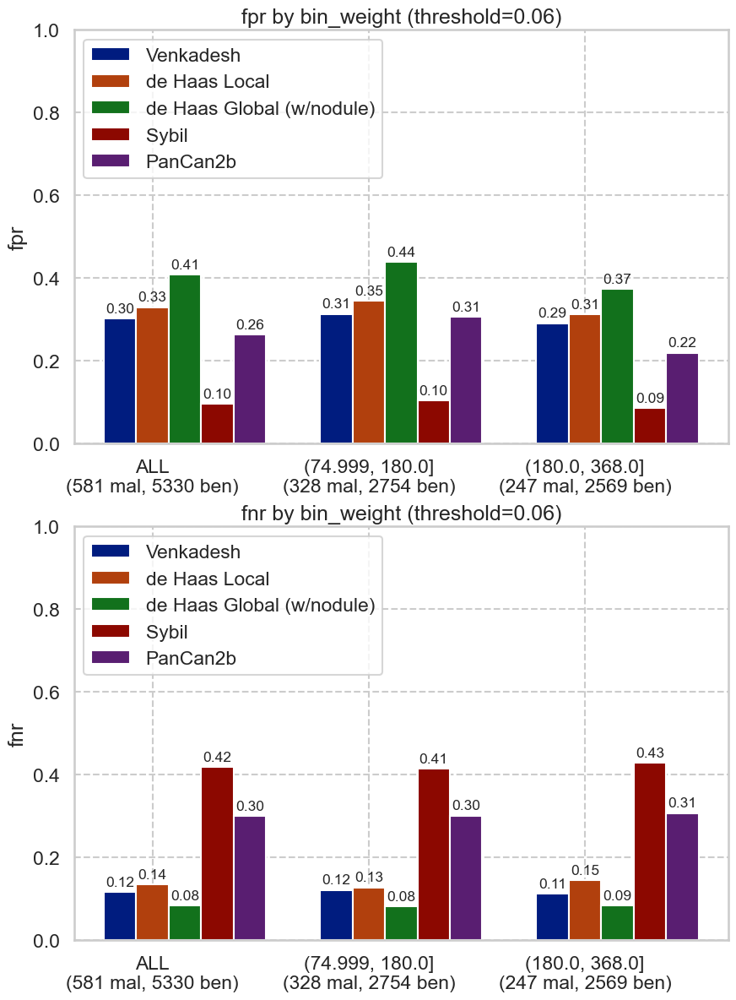

C:\Users\shaur\AppData\Local\Temp\ipykernel_13928\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                  Age  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_Age                                                                       
(53.999, 62.0]  2988.0  0.088353  0.283856  0.0  0.0  0.0  0.0  1.0  2988.0   
(62.0, 76.0]    2923.0  0.108450  0.311001  0.0  0.0  0.0  0.0  1.0  2923.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_Age                                                            
(53.999, 62.0]  58.811245  2.123374  54.0  57.0  59.0  61.0  62.0  
(62.0, 76.0]    67.653780  3.453298  63.0  65.0  67.0  70.0  76.0

### bin_Age

C:\Users\shaur\AppData\Local\Temp\ipykernel_13928\1626763021.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,num_mal,pct_mal
"(53.999, 62.0]",2988,50.549822,264,8.835341
"(62.0, 76.0]",2923,49.450178,317,10.845022


['ALL', Interval(53.999, 62.0, closed='right'), Interval(62.0, 76.0, closed='right')]
['ALL', Interval(53.999, 62.0, closed='right'), Interval(62.0, 76.0, closed='right')]


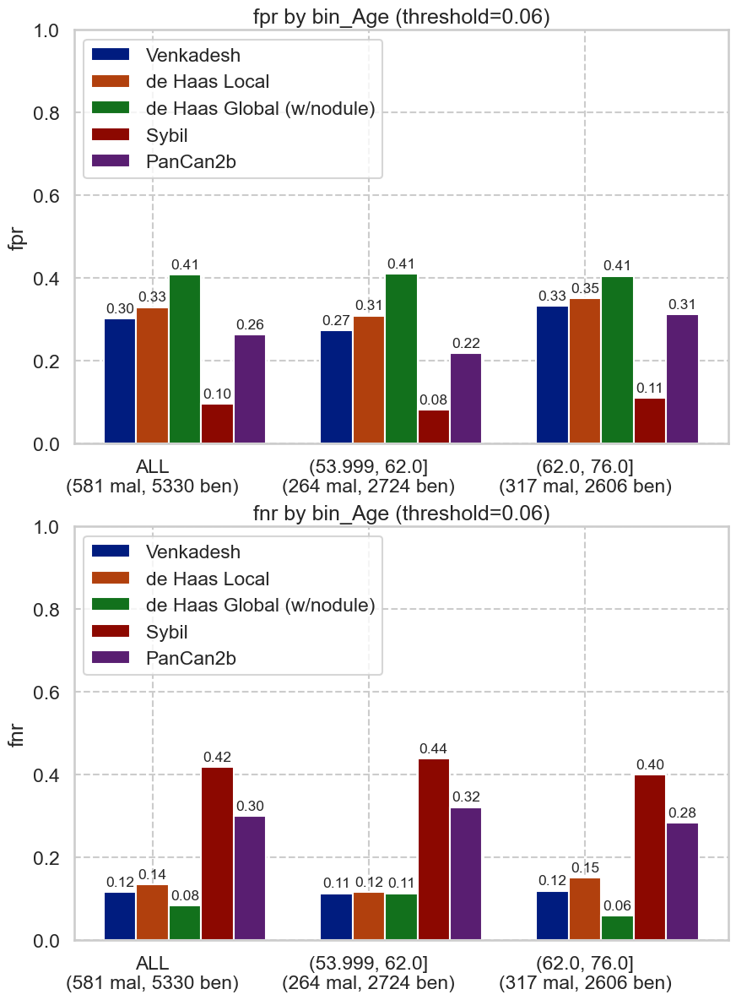

C:\Users\shaur\AppData\Local\Temp\ipykernel_13928\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                          \
                              count      mean       std  min  25%  50%  75%   
bin_BMI                                                                       
(13.283000000000001, 26.87]  2956.0  0.112314  0.315806  0.0  0.0  0.0  0.0   
(26.87, 57.631]              2936.0  0.082425  0.275058  0.0  0.0  0.0  0.0   

                                     BMI                                  \
                             max   count       mean       std        min   
bin_BMI                                                                    
(13.283000000000001, 26.87]  1.0  2956.0  23.753599  2.257101  13.284203   
(26.87, 57.631]              1.0  2936.0  31.382861  3.818099  26.873766   

                                                                         
                                   25%        50%        75%        max  
bin_BMI                                                                  
(13.283000000000001, 26.87]  22.312778  24.207989  25.603538  26.870222  
(26.87, 57.631]              28.478009  30.406574  33.190637  57.630653

### bin_BMI

C:\Users\shaur\AppData\Local\Temp\ipykernel_13928\1626763021.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,num_mal,pct_mal
"(13.283000000000001, 26.87]",2956,50.169722,332,11.231394
"(26.87, 57.631]",2936,49.830278,242,8.242507


['ALL', Interval(13.283000000000001, 26.87, closed='right'), Interval(26.87, 57.631, closed='right')]
['ALL', Interval(13.283000000000001, 26.87, closed='right'), Interval(26.87, 57.631, closed='right')]


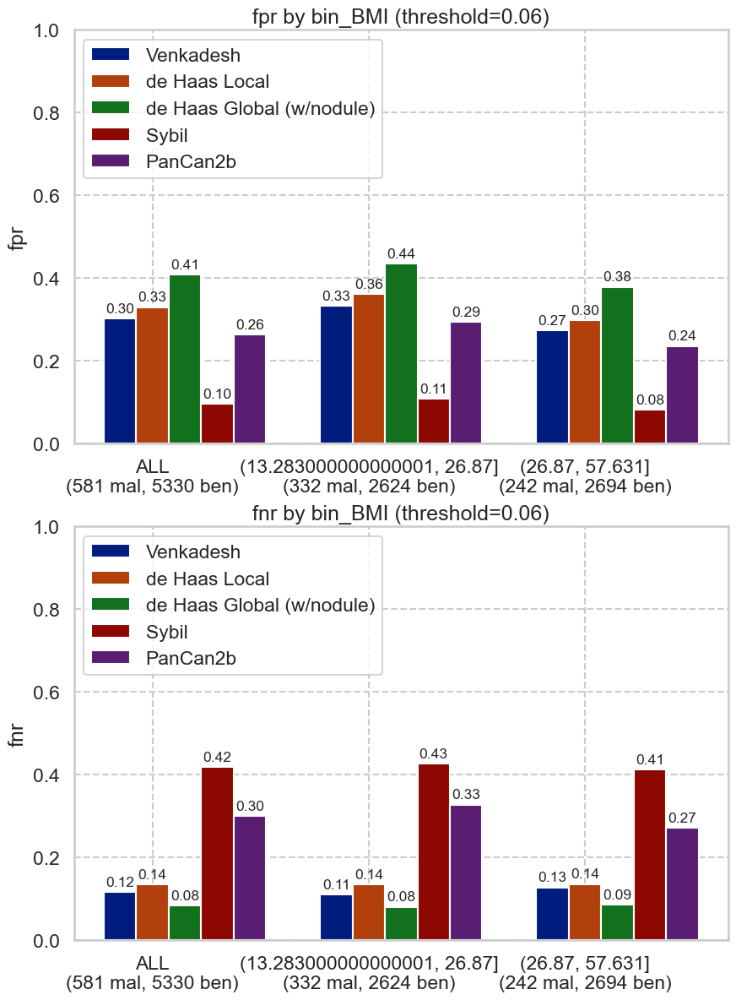

In [39]:
for c in nlst_democols['num']['demo']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

In [40]:
# nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True, labels=False)
# display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
# plot_by_category(nlst_preds, f'bin_height')

In [41]:
# nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True, labels=False)
# display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
# plot_by_category(nlst_preds, f'bin_weight')

### Smoking columns

#### pkyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,57.459653,24.397554,30.0,40.0,50.0,68.0,260.0
1,581.0,66.164716,30.131594,30.0,45.0,56.0,84.0,232.0


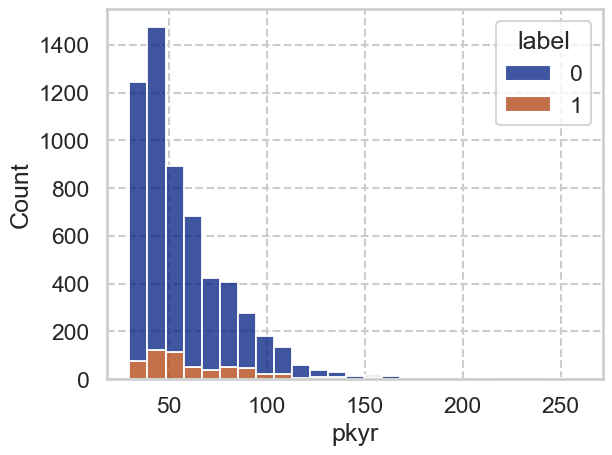

#### smokeage

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,16.524015,3.508332,5.0,15.0,16.0,18.0,40.0
1,581.0,16.204819,3.520048,6.0,14.0,16.0,18.0,30.0


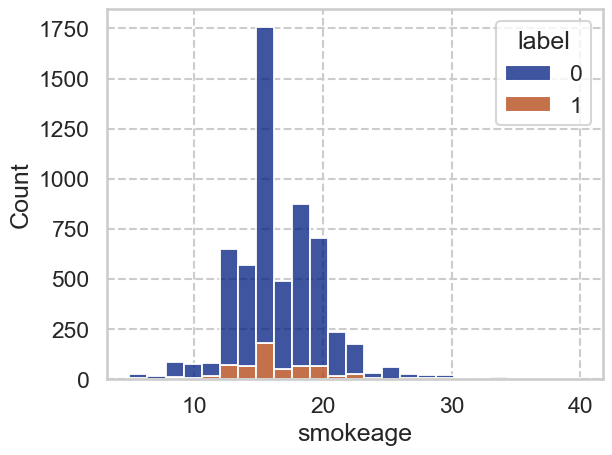

#### smokeday

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,28.436961,11.575912,12.0,20.0,25.0,35.0,135.0
1,581.0,30.485370,12.745731,15.0,20.0,30.0,40.0,80.0


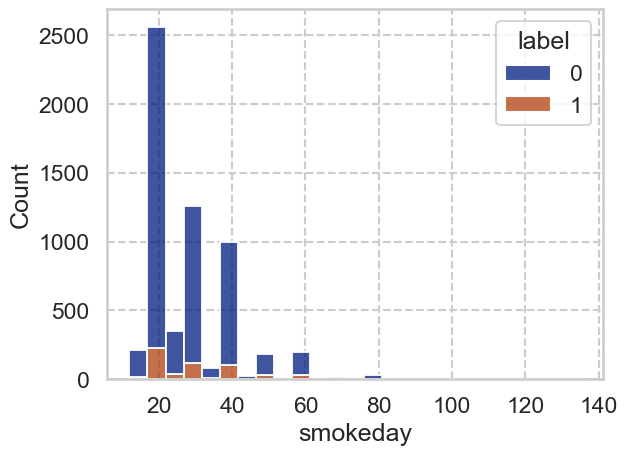

#### smokeyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,40.903940,7.364423,16.0,36.0,41.0,46.0,67.0
1,581.0,43.595525,7.225905,25.0,39.0,44.0,49.0,65.0


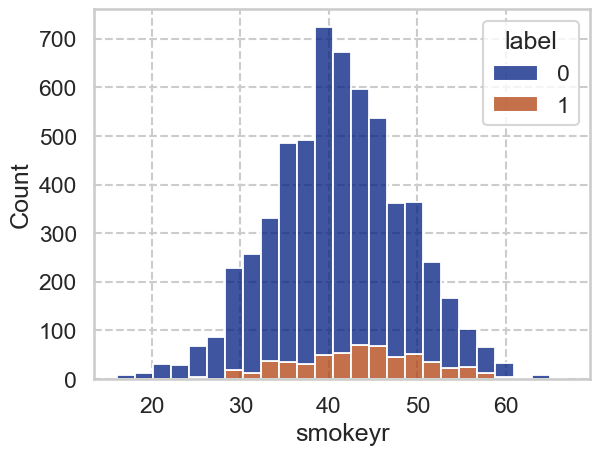

In [42]:
for c in nlst_democols['num']['smoke']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                                 pkyr  \
           count      mean       std  min  25%  50%  75%  max   count   
bin_pkyr                                                                
0         3027.0  0.079617  0.270744  0.0  0.0  0.0  0.0  1.0  3027.0   
1         2884.0  0.117892  0.322536  0.0  0.0  0.0  0.0  1.0  2884.0   

                                                                
               mean        std    min   25%   50%   75%    max  
bin_pkyr                                                        
0         40.627800   5.760036  30.00  36.0  41.0  45.0   51.0  
1         76.879785  24.261537  51.25  60.0  70.0  87.5  260.0

### bin_pkyr

,num,pct,num_mal,pct_mal
0,3027,51.209609,241,7.961678
1,2884,48.790391,340,11.789182


['ALL', 0, 1]
['ALL', 0, 1]


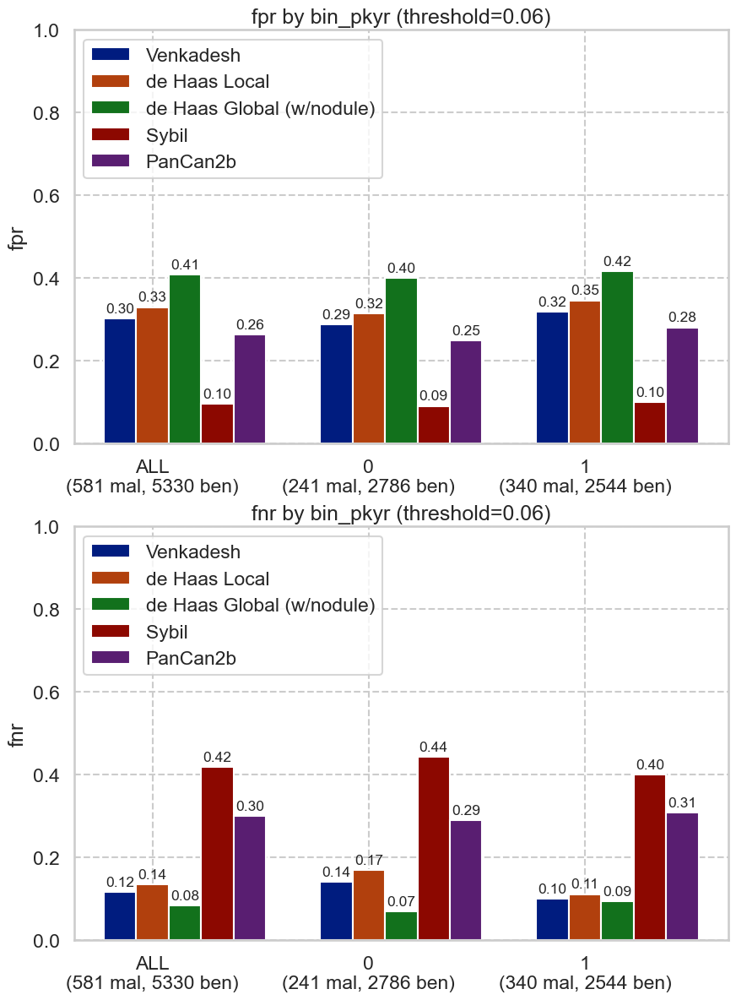

label                                              smokeage  \
               count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                 
0             3256.0  0.106572  0.308616  0.0  0.0  0.0  0.0  1.0   3256.0   
1             2655.0  0.088136  0.283545  0.0  0.0  0.0  0.0  1.0   2655.0   

                                                                 
                   mean       std   min   25%   50%   75%   max  
bin_smokeage                                                     
0             14.136978  2.000377   5.0  13.0  15.0  16.0  16.0  
1             19.381544  2.716198  17.0  18.0  18.0  20.0  40.0

### bin_smokeage

,num,pct,num_mal,pct_mal
0,3256,55.083742,347,10.657248
1,2655,44.916258,234,8.813559


['ALL', 0, 1]
['ALL', 0, 1]


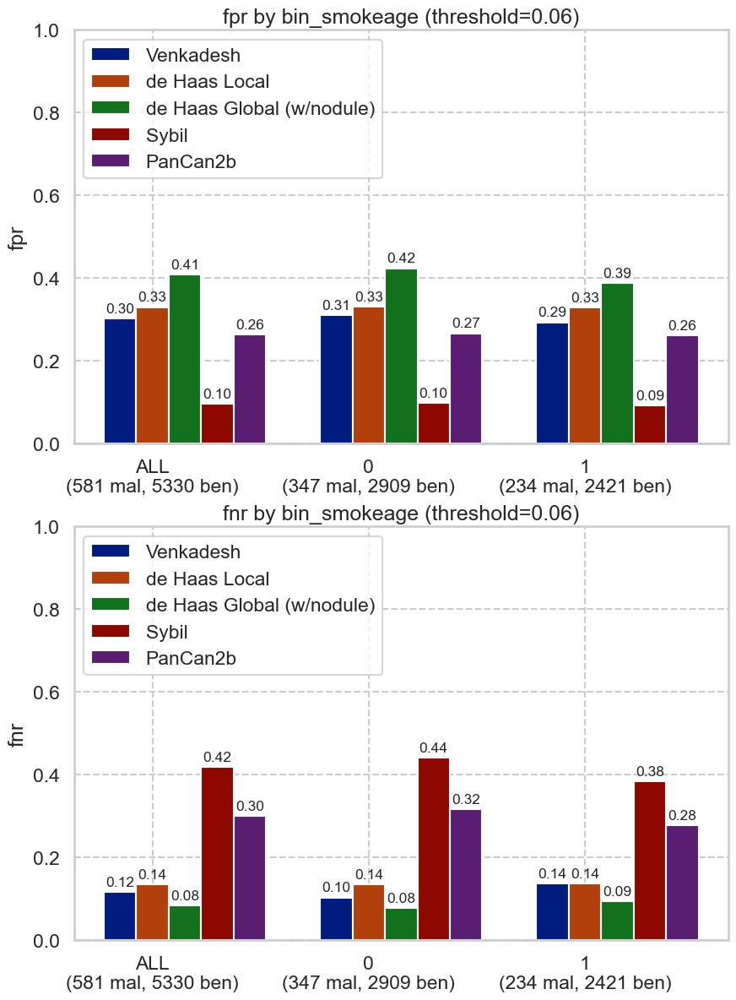

label                                              smokeday  \
               count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                 
0             3119.0  0.089772  0.285901  0.0  0.0  0.0  0.0  1.0   3119.0   
1             2792.0  0.107808  0.310193  0.0  0.0  0.0  0.0  1.0   2792.0   

                                                                   
                   mean        std   min   25%   50%   75%    max  
bin_smokeday                                                       
0             20.117025   2.153974  12.0  20.0  20.0  20.0   25.0  
1             38.157593  10.650142  26.0  30.0  40.0  40.0  135.0

### bin_smokeday

,num,pct,num_mal,pct_mal
0,3119,52.766029,280,8.977236
1,2792,47.233971,301,10.780802


['ALL', 0, 1]
['ALL', 0, 1]


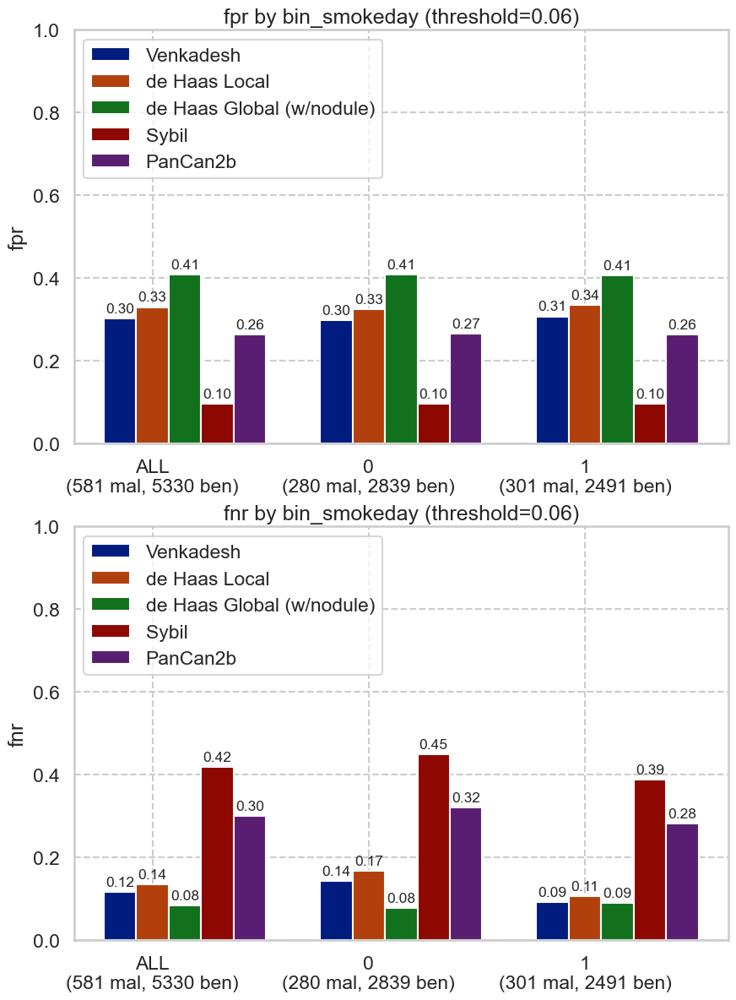

label                                              smokeyr  \
              count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                
0            3073.0  0.070290  0.255676  0.0  0.0  0.0  0.0  1.0  3073.0   
1            2838.0  0.128612  0.334829  0.0  0.0  0.0  0.0  1.0  2838.0   

                                                                
                  mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                     
0            35.559714  4.645131  16.0  33.0  36.0  39.0  41.0  
1            47.241720  4.421492  42.0  44.0  46.0  50.0  67.0

### bin_smokeyr

,num,pct,num_mal,pct_mal
0,3073,51.987819,216,7.028962
1,2838,48.012181,365,12.861170


['ALL', 0, 1]
['ALL', 0, 1]


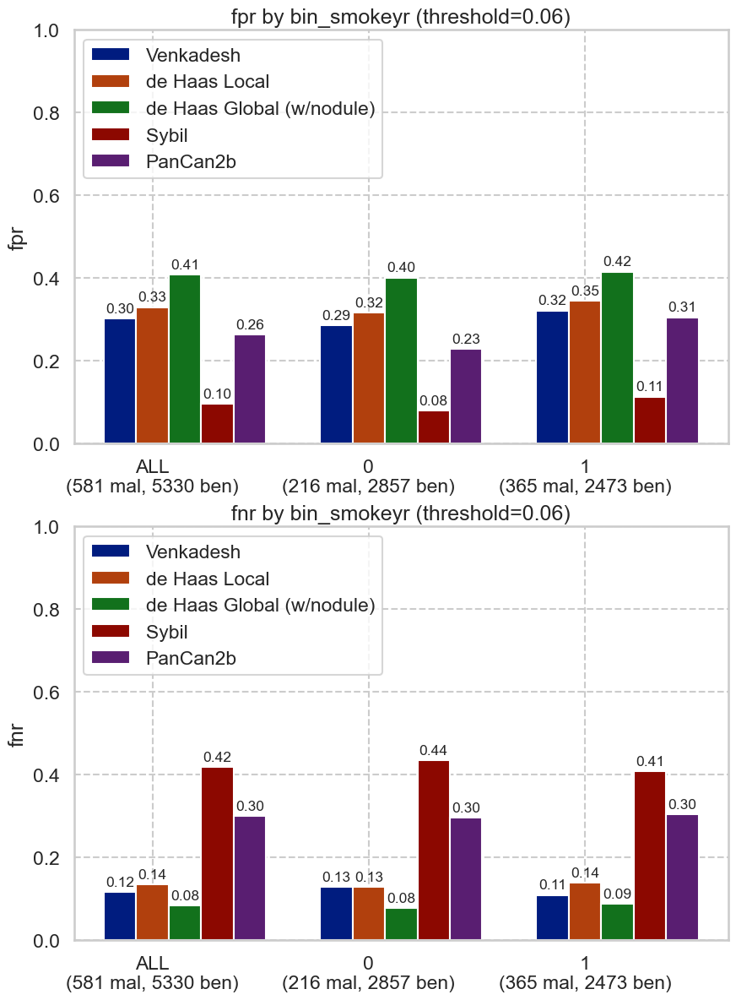

In [43]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, labels=False)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

#### Diameter [mm]

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,8.446379,5.104287,4.0,5.2,6.8,9.7,64.7
1,581.0,14.567642,9.611311,4.1,8.5,12.2,17.8,83.0


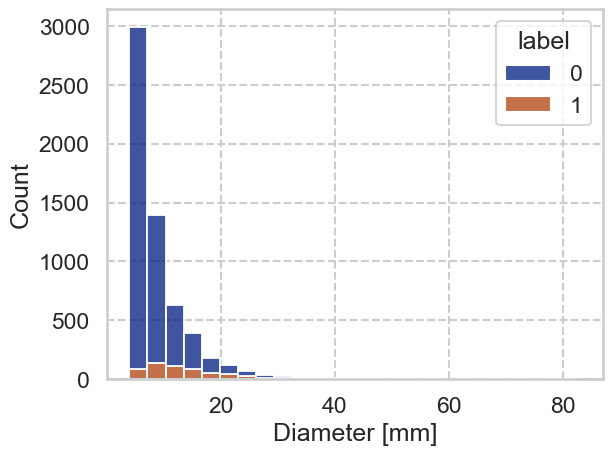

#### NoduleCounts

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,1.857786,1.240176,1.0,1.0,1.0,2.0,11.0
1,581.0,2.287435,1.300529,1.0,1.0,2.0,3.0,11.0


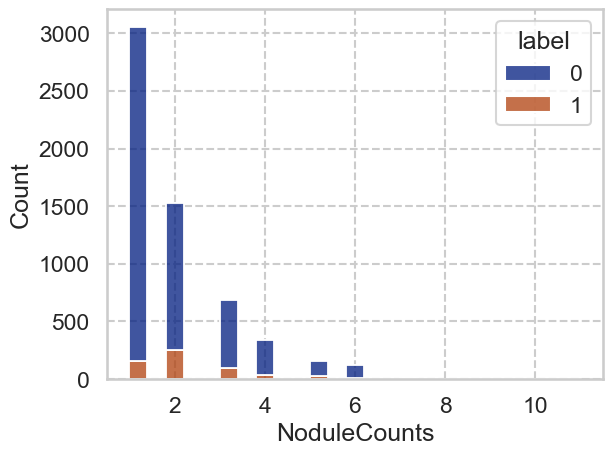

In [44]:
included_num_cols = ["Diameter [mm]", "NoduleCounts"]
for c in included_num_cols:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                               \
                   count      mean       std  min  25%  50%  75%  max   
bin_NoduleCounts                                                        
0                 3054.0  0.050753  0.219529  0.0  0.0  0.0  0.0  1.0   
1                 2857.0  0.149107  0.356257  0.0  0.0  0.0  0.0  1.0   

                 NoduleCounts                                                
                        count      mean       std  min  25%  50%  75%   max  
bin_NoduleCounts                                                             
0                      3054.0  1.000000  0.000000  1.0  1.0  1.0  1.0   1.0  
1                      2857.0  2.862093  1.206261  2.0  2.0  2.0  3.0  11.0

### bin_NoduleCounts

,num,pct,num_mal,pct_mal
0,3054,51.666385,155,5.075311
1,2857,48.333615,426,14.910746


['ALL', 0, 1]
['ALL', 0, 1]


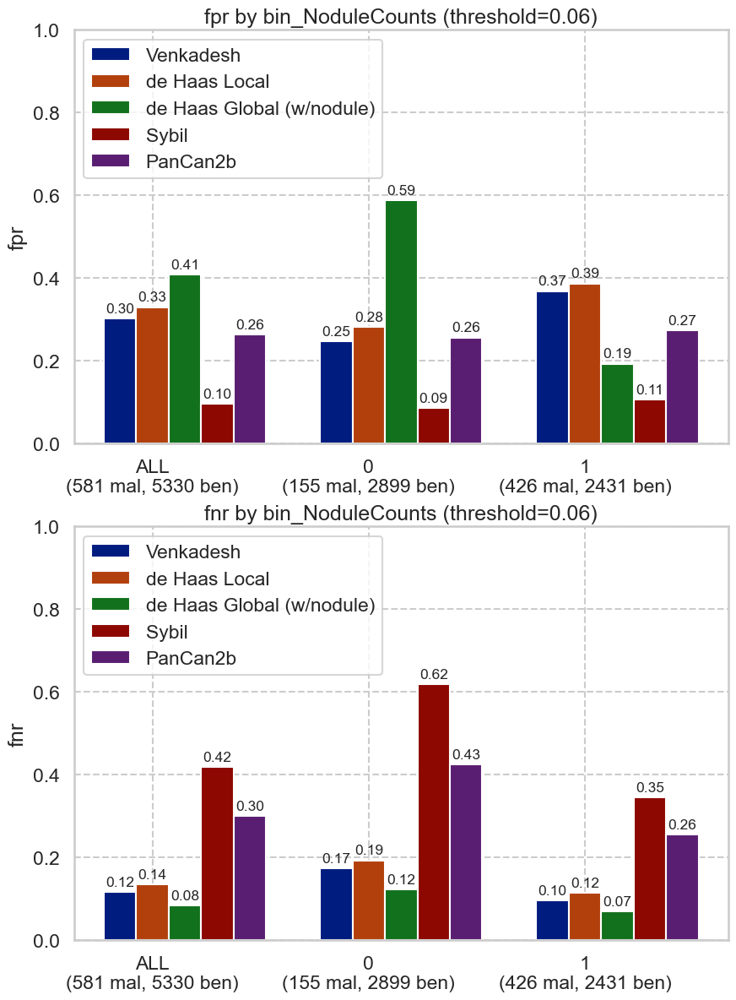

In [45]:
# for c in included_num_cols:
#     nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
#     display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
#     plot_by_category(nlst_preds, f'bin_{c}')
nlst_preds['bin_NoduleCounts'] = pd.cut(nlst_preds['NoduleCounts'], bins=[0, 1, 12], right=True, labels=False)
display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())
plot_by_category(nlst_preds, f'bin_NoduleCounts')

label                                               \
                    count      mean       std  min  25%  50%  75%  max   
bin_Diameter [mm]                                                        
0                  2993.0  0.028065  0.165188  0.0  0.0  0.0  0.0  1.0   
1                  2918.0  0.170322  0.375980  0.0  0.0  0.0  0.0  1.0   

                  Diameter [mm]                                             \
                          count       mean       std  min  25%   50%   75%   
bin_Diameter [mm]                                                            
0                        2993.0   5.437755  0.878854  4.0  4.7   5.4   6.2   
1                        2918.0  12.751131  6.694085  7.2  8.5  10.6  14.6   

                         
                    max  
bin_Diameter [mm]        
0                   7.1  
1                  83.0

### bin_Diameter [mm]

,num,pct,num_mal,pct_mal
0,2993,50.63441,84,2.806549
1,2918,49.36559,497,17.032214


['ALL', 0, 1]
['ALL', 0, 1]


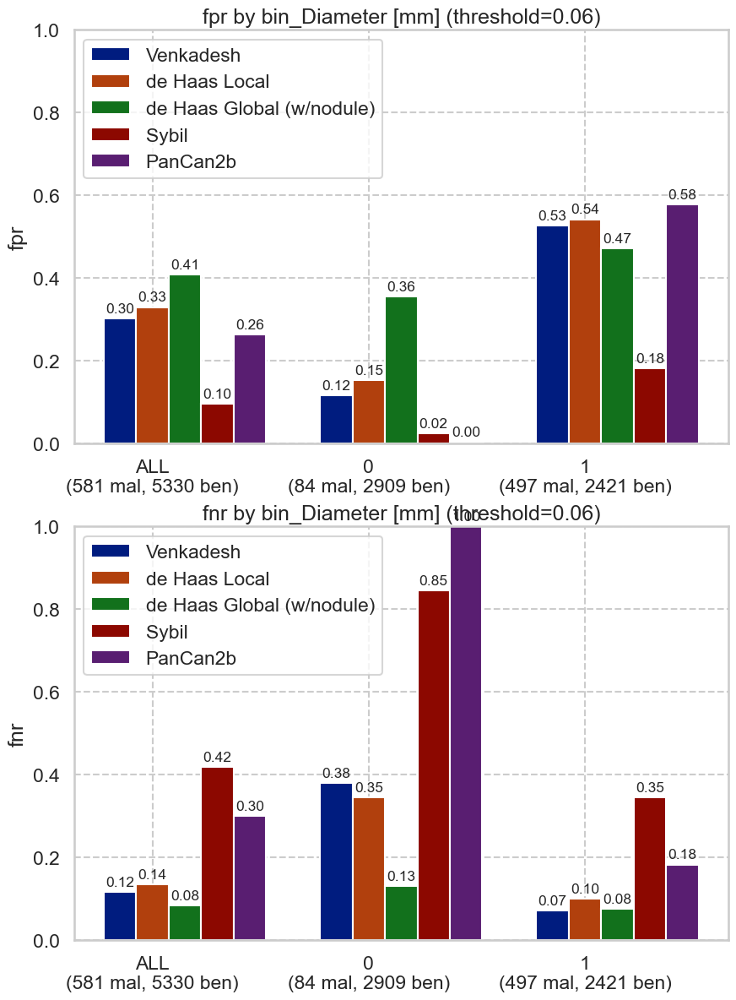

In [46]:
nlst_preds['bin_Diameter [mm]'] = pd.qcut(nlst_preds['Diameter [mm]'], q=2, labels=False)
display(nlst_preds.groupby(f'bin_Diameter [mm]')[['label', f'Diameter [mm]']].describe())
plot_by_category(nlst_preds, f'bin_Diameter [mm]')